[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Nishani53/Khanal_MSc_Thesis_MSU/blob/main/Forest%20Coverage%20Analysis%20August%202025/Forest%20Coverage%20Analysis%20August%202025.ipynb)


# 🌲 Forest Market Coverage & Forest Area Overlay Analysis

This repository contains scripts and data for quantifying **forest area** within **procurement zones** of biomass, hardwood, softwood, and pulpwood markets in Michigan, across multiple decades.  
It also identifies how much forest land was **retained**, **lost**, or **newly added** to market coverage between years, broken down by **forest type**.

---

## 📌 Objective

To accurately measure forestland within market coverage zones for:

- 🌳 **Hardwood Sawlogs**
- 🌲 **Softwood Sawlogs**
- 🧻 **Pulpwood**
- 🔥 **Biomass**

The workflow overlays **market coverage shapefiles** with **forest cover and forest type rasters** to calculate area (in acres) by forest group and track temporal changes.

---

## 🗺️ Data Sources

### 1. **Market Coverage Shapefiles**
- Represent procurement zones for different products and years.
- Contain a `status` field with:
  - **Market Retain** – areas present in both time periods
  - **Market Loss** – areas present in earlier period only
  - **Market Add** – areas new in the later period

### 2. **Competition Class Hotspot Maps**
- Dissolved polygons showing overlapping procurement zones.
- Classified into:
  - `1 - Lowest`
  - `2 - Low`
  - `3 - Medium`
  - `4 - High`

### 3. **Forest Cover & Forest Type Rasters**
- **NLCD Land Cover** (2001, 2019) – identifies forest/non-forest pixels.
- **FIA Forest Type Groups** – classifies forest by species group.
- ~30m resolution.

---

## 🧠 Method Overview

1. **Reprojection** – All shapefiles reprojected to raster CRS.
2. **Raster Clipping** – Each polygon masks the raster to extract only relevant pixels.
3. **Filtering** – Select only valid forest classes or forest type groups.
4. **Area Calculation** – Count pixels × pixel area (m²) → acres.
5. **Summarization** – Report total forest area and breakdown by forest type.

---

## 🛠️ Python Libraries Used

- [`geopandas`](https://geopandas.org/) – vector data handling
- [`matplotlib`](https://matplotlib.org/) – mapping and visualization
- [`rasterio`](https://rasterio.readthedocs.io/) – raster I/O and masking
- [`fiona`](https://fiona.readthedocs.io/) – shapefile I/O
- [`shapely`](https://shapely.readthedocs.io/) – geometry operations
- [`pyproj`](https://pyproj4.github.io/pyproj/stable/) – coordinate transformations
- [`numpy`](https://numpy.org/) – pixel counting and calculations

---

## 📈 Output Examples

For each polygon:
- **Total forest area** (acres)
- **Forest area by type group** (acres)
- Side-by-side plots of **undissolved** (competition classes) vs. **dissolved** (full coverage)

Example change classification visualization:

| Status         | Color      |
|----------------|------------|
| Market Retain  | Light Gray |
| Market Loss    | Red        |
| Market Add     | Blue       |

---

## 📂 Repository Structure

```
Data/
    biomass_coverage_*.shp
    biomass_change_*-*.shp
    hardwood_coverage_*.shp
    hardwood_change_*-*.shp
    softwood_coverage_*.shp
    softwood_change_*-*.shp
    pulpwood_coverage_*.shp
    pulpwood_change_*-*.shp
    *_hotspots_*.shp
    Counties_(v17a).shp
    forest_cover_2019.tif
    lulc2001.tif
Scripts/
    01_generate_change_shapefiles.py
    02_visualize_changes.py
    03_forest_cover_area_calculation.py
    04_forest_type_area_calculation.py
Outputs/
    Plots/
    Tables/
README.md
```

---

## 🚀 Usage

**Run in Colab:**  
Click the badge at the top to open the main notebook in Google Colab with all dependencies pre-installed.

**Local Execution:**  
1. Clone the repository:
```bash
git clone https://github.com/Nishani53/Khanal_MSc_Thesis_MSU.git
```
2. Install dependencies:
```bash
pip install geopandas matplotlib rasterio fiona shapely pyproj numpy
```
3. Run analysis scripts from the `Scripts` folder.

---

## 📅 Time Periods Analyzed
- **1985–1994**
- **1994–2002**
- **2002–2018**
- **2018–2023**
- **1985–2023** (long-term change)

---

## 📜 License
This repository is for academic research. Please contact the author before reuse or redistribution.


In [44]:
!pip install rasterio geopandas shapely
!pip install geopandas fiona
!pip install matplotlib-scalebar
!pip install gdown
!pip install pydrive
!pip install matplotlib-scalebar


In [45]:
# 📁 Step 1: Clean Colab working directory
%cd /content
!rm -rf sample_data/ repo.zip Khanal_MSc_Thesis_MSU-main "Market Coverage August 11.7z"

# 🛠️ Step 2: Install 7-Zip
!apt-get install -y p7zip-full

# 📥 Step 3: Download your GitHub repo
!curl -L -o repo.zip https://github.com/Nishani53/Khanal_MSc_Thesis_MSU/archive/refs/heads/main.zip
!unzip -q repo.zip

# 📂 Step 4: Navigate to folder containing Market Coverage August 11.7z
%cd "Khanal_MSc_Thesis_MSU-main/Forest Coverage Analysis August 2025/Data"

# 📥 Step 5: Download Market Coverage August 11.7z (if you want fresh copy from GitHub)
!curl -L -o "Market Coverage August 11.7z" "https://github.com/Nishani53/Khanal_MSc_Thesis_MSU/raw/main/Forest%20Coverage%20Analysis%20August%202025/Data/Market%20Coverage%20August%2011.7z"

# 📂 Step 6: Extract the .7z file (contains Market Coverage August 11/Data)
!7z x -y "Market Coverage August 11.7z"

# 📂 Step 7: Set base path to extracted Data folder
base_path = "/content/Khanal_MSc_Thesis_MSU-main/Forest Coverage Analysis August 2025/Data/Market Coverage August 11/Data"

import os

print("📁 Listing all files in extracted Data folder:\n")
for root, dirs, files in os.walk(base_path):
    for file in files:
        print(os.path.join(root, file))


/content
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
p7zip-full is already the newest version (16.02+dfsg-8).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 25.2M    0 25.2M    0     0  8477k      0 --:--:--  0:00:03 --:--:-- 17.9M
/content/Khanal_MSc_Thesis_MSU-main/Forest Coverage Analysis August 2025/Data
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 86.8M  100 86.8M    0     0  20.4M      0  0:00:04  0:00:04 --:--:-- 29.2M

7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-

# Forest Coverage Area for Market Added, Lost, and Retained
Later in this analysis, there will be forest coverage for different competition class for different forest Products.

# Biomass

# 1985-1994

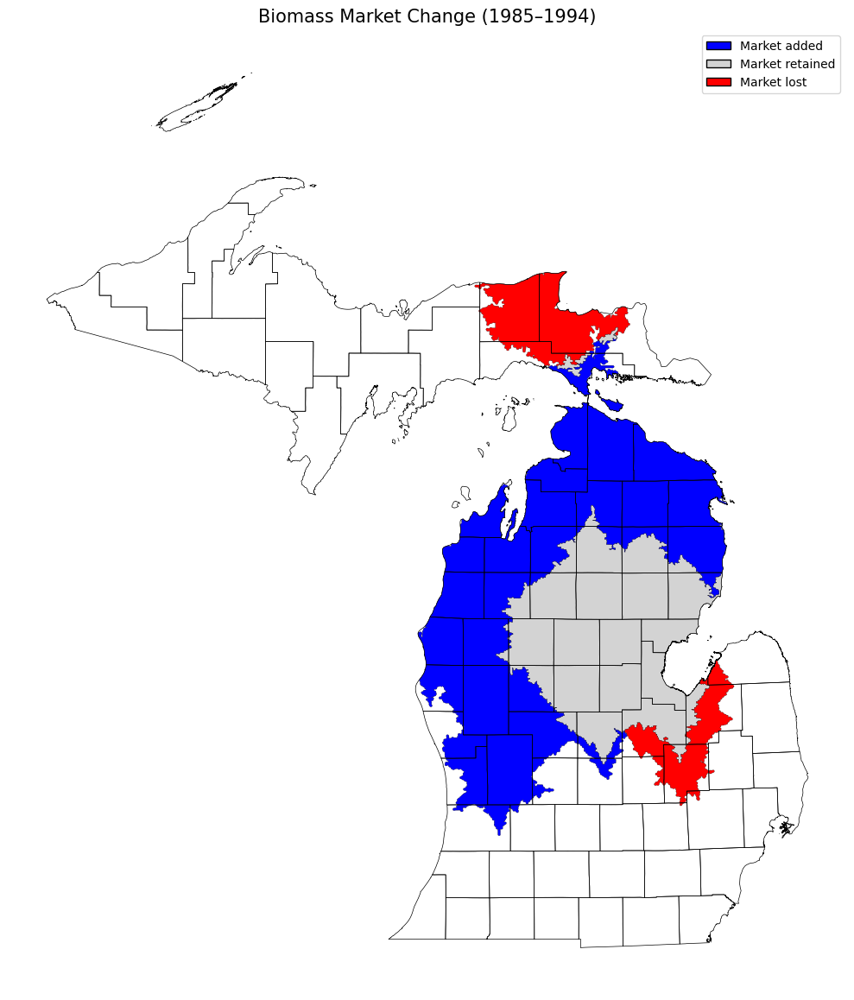

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "biomass_change_1985-1994.shp")
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (1985–1994)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1985-1994.shp")  # <-- updated years

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 2,285,243.15 acres.
Polygon 'Market Loss' has a forest area of 818,245.63 acres.
Polygon 'Market Add' has a forest area of 4,484,111.39 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1985-1994.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 2853908.31 acres.
   White/Red/Jack Pine Group: 644542.50 acres
   Spruce/Fir Group: 187784.36 acres
   Oak/Hickory Group: 818.54 acres
   Elm/Ash/Cottonwood Group: 231.66 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 2020438.59 acres

Polygon 'Market Loss' has a forest area of 1177563.43 acres.
   White/Red/Jack Pine Group: 247568.32 acres
   Spruce/Fir Group: 455692.51 acres
   Oak/Hickory Group: 216.22 acres
   Aspen/Birch Group: 474086.39 acres

Polygon 'Market Add' has a forest area of 5172494.52 acres.
   White/Red/Jack Pine Group: 1025562.97 acres
   Spruce/Fir Group: 562287.43 acres
   Oak/Hickory Group: 231.66 acres
   Elm/Ash/Cottonwood Group: 1328.19 acres
   Aspen/Birch Group: 3583084.28 acres



# 1994-2002

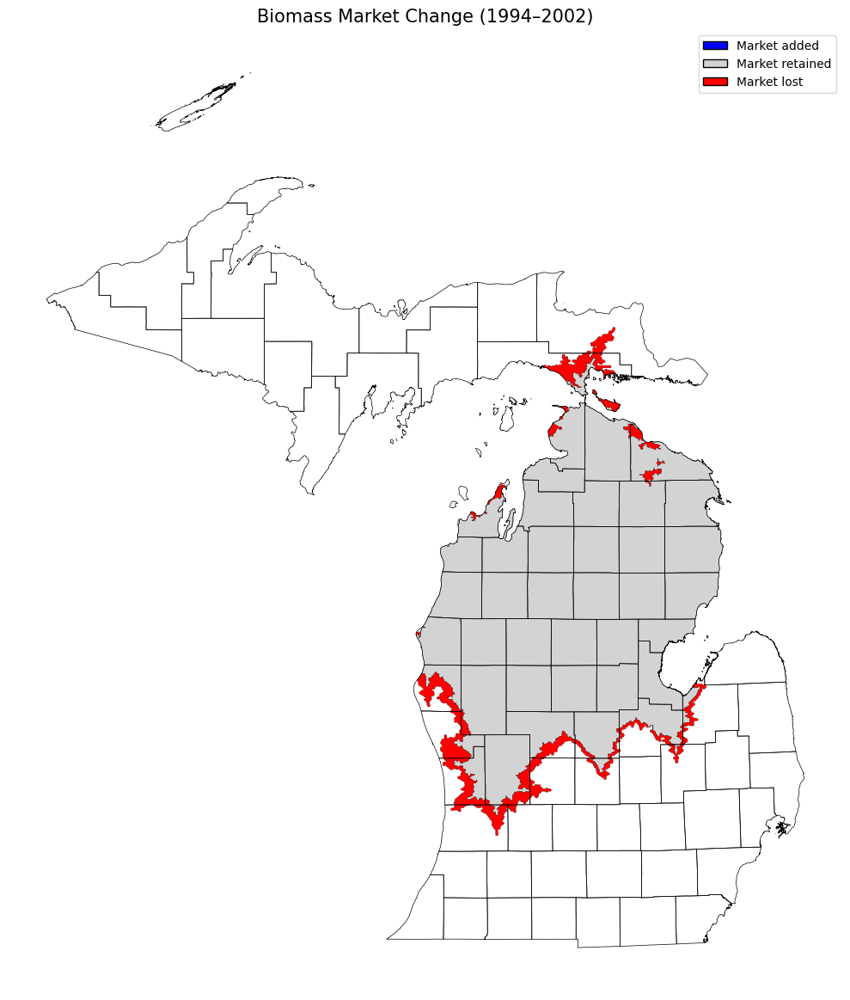

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "biomass_change_1994-2002.shp")  # <-- updated years
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (1994–2002)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1994-2002.shp")  # <-- updated years

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 6,384,712.80 acres.
Polygon 'Market Loss' has a forest area of 384,641.74 acres.
Polygon 'Market Add' has a forest area of 20.91 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1994-2002.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 7579220.00 acres.
   White/Red/Jack Pine Group: 1633039.72 acres
   Spruce/Fir Group: 666210.52 acres
   Oak/Hickory Group: 942.09 acres
   Elm/Ash/Cottonwood Group: 1559.85 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 5277375.15 acres

Polygon 'Market Loss' has a forest area of 447182.83 acres.
   White/Red/Jack Pine Group: 37065.75 acres
   Spruce/Fir Group: 83861.26 acres
   Oak/Hickory Group: 108.11 acres
   Aspen/Birch Group: 326147.71 acres

Polygon 'Market Add' has a forest area of 30.89 acres.
   Aspen/Birch Group: 30.89 acres



# 2002-2018

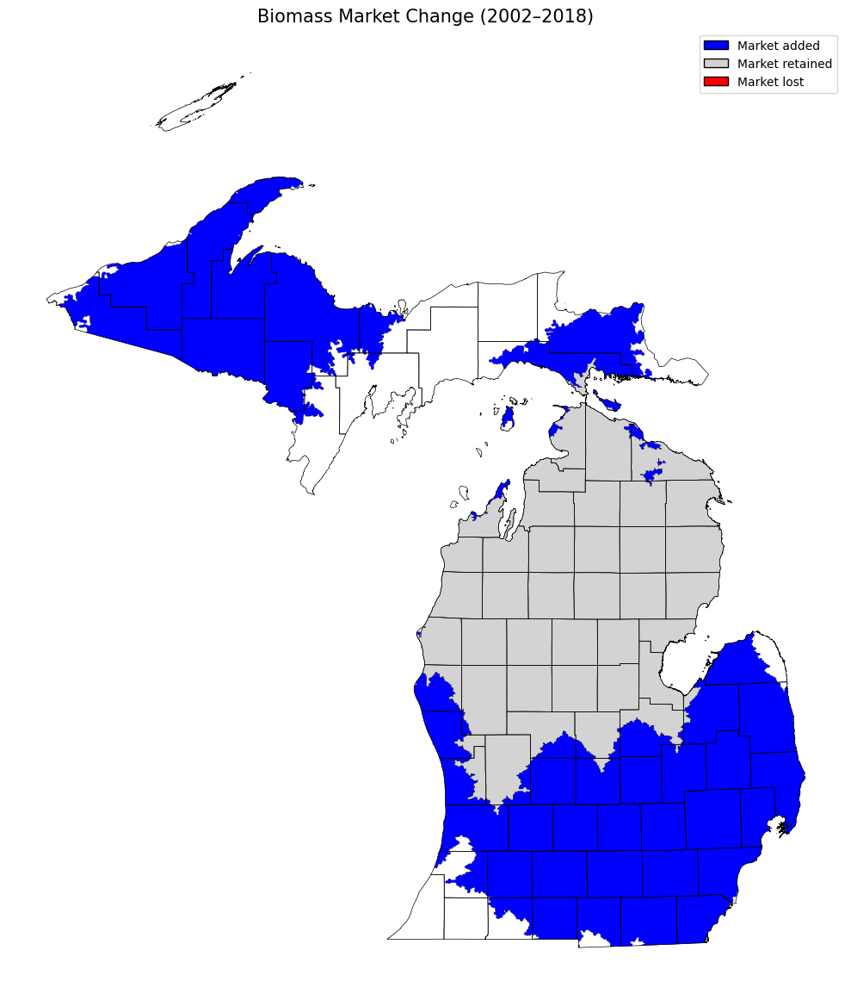

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "biomass_change_2002-2018.shp")  # <-- updated years
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (2002–2018)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_2002-2018.shp")  # <-- updated years

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 6,384,161.26 acres.
Polygon 'Market Loss' has a forest area of 572.44 acres.
Polygon 'Market Add' has a forest area of 7,301,066.21 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_2002-2018.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 7579142.78 acres.
   White/Red/Jack Pine Group: 1632993.39 acres
   Spruce/Fir Group: 666179.64 acres
   Oak/Hickory Group: 942.09 acres
   Elm/Ash/Cottonwood Group: 1559.85 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 5277375.15 acres

Polygon 'Market Loss' has a forest area of 108.11 acres.
   White/Red/Jack Pine Group: 46.33 acres
   Spruce/Fir Group: 30.89 acres
   Aspen/Birch Group: 30.89 acres

Polygon 'Market Add' has a forest area of 7769073.86 acres.
   White/Red/Jack Pine Group: 364726.98 acres
   Spruce/Fir Group: 1209100.21 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 74672.04 acres
   Elm/Ash/Cottonwood Group: 100031.19 acres
   Maple/Beech/Birch Group: 3425616.62 acres
   Aspen/Birch Group: 2594787.83 acres



# 2018-2023

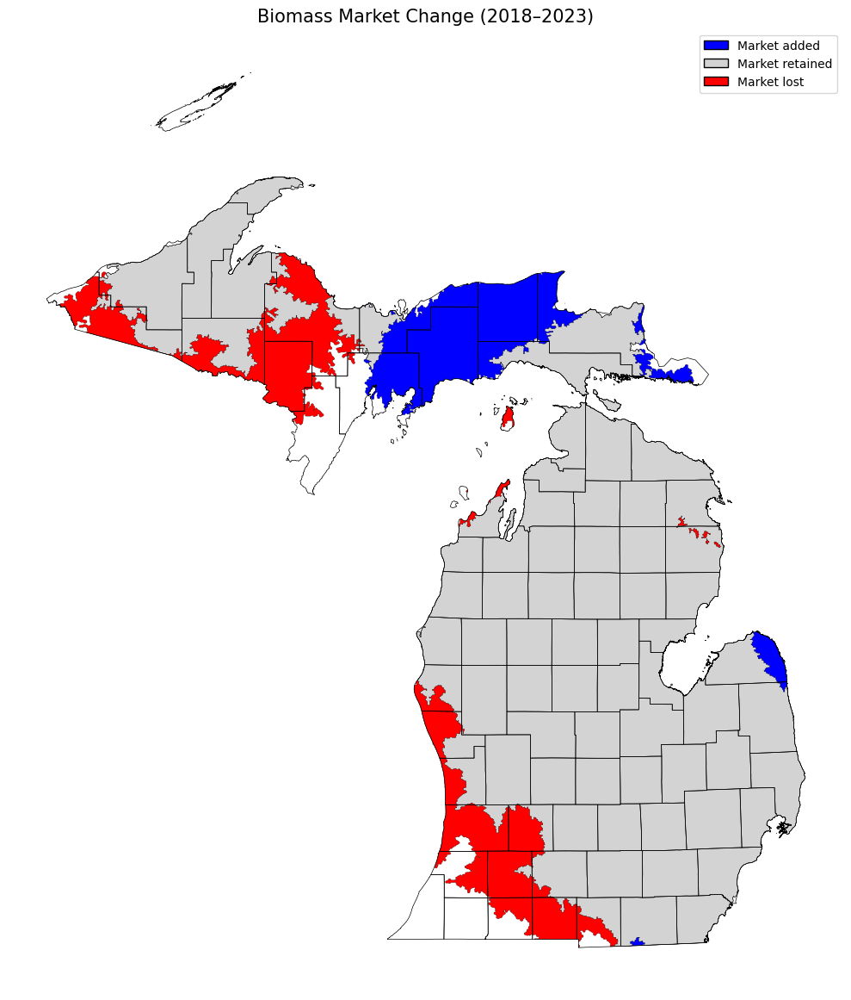

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "biomass_change_2018-2023.shp")  # <-- updated years
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (2018–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_2018-2023.shp")  # <-- updated years

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 11,715,354.85 acres.
Polygon 'Market Loss' has a forest area of 1,969,872.63 acres.
Polygon 'Market Add' has a forest area of 1,259,962.25 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_2018-2023.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 12872950.42 acres.
   White/Red/Jack Pine Group: 1844268.17 acres
   Spruce/Fir Group: 1429208.99 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 25930.58 acres
   Elm/Ash/Cottonwood Group: 32494.31 acres
   Maple/Beech/Birch Group: 2366431.92 acres
   Aspen/Birch Group: 7174477.46 acres

Polygon 'Market Loss' has a forest area of 2475266.23 acres.
   White/Red/Jack Pine Group: 153452.21 acres
   Spruce/Fir Group: 446070.86 acres
   Oak/Hickory Group: 49683.55 acres
   Elm/Ash/Cottonwood Group: 69096.74 acres
   Maple/Beech/Birch Group: 1059277.36 acres
   Aspen/Birch Group: 697685.52 acres

Polygon 'Market Add' has a forest area of 2246338.89 acres.
   White/Red/Jack Pine Group: 414317.86 acres
   Spruce/Fir Group: 916651.44 acres
   Oak/Hickory Group: 5034.76 acres
   Elm/Ash/Cottonwood Group: 8355.24 acres
   Maple/Beech/Birch Group: 216124.21 acres
   Aspen/Birch Group: 685855.37 acres



# 1985-2023

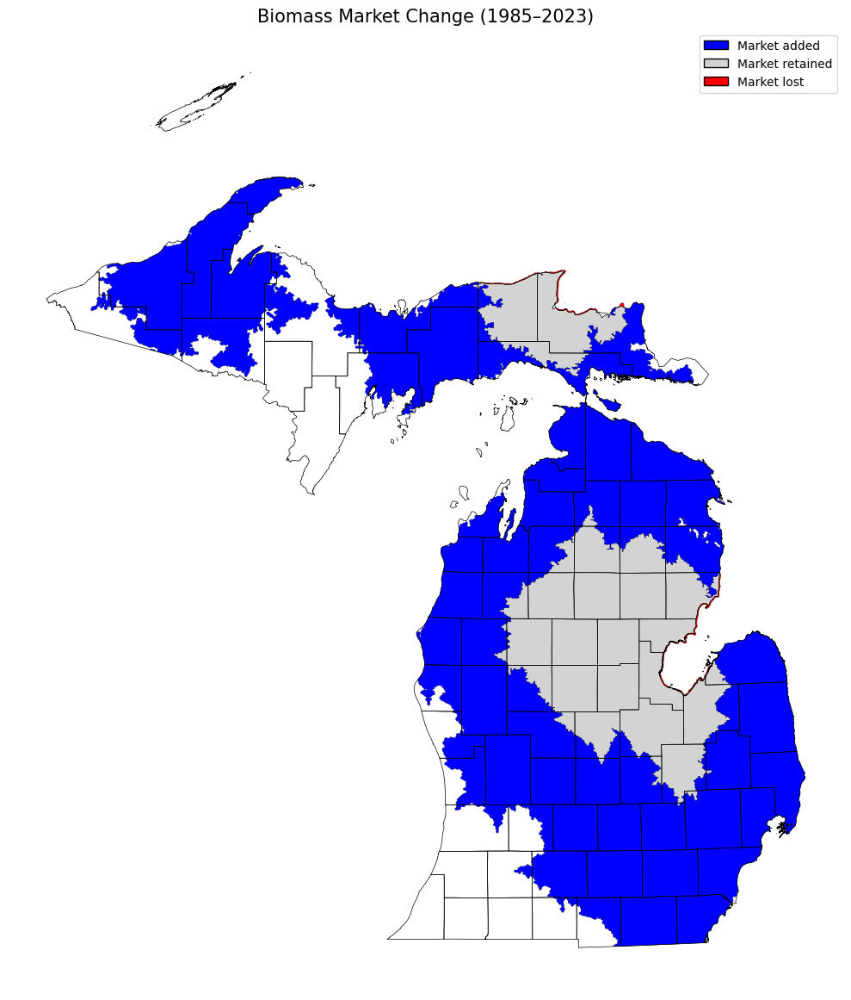

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "biomass_change_1985-2023.shp")  # <-- updated years
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (1985–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1985-2023.shp")  # <-- updated years

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 3,103,479.89 acres.
Polygon 'Market Loss' has a forest area of 8.90 acres.
Polygon 'Market Add' has a forest area of 9,871,837.21 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1985-2023.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 4031456.30 acres.
   White/Red/Jack Pine Group: 892110.83 acres
   Spruce/Fir Group: 643476.86 acres
   Oak/Hickory Group: 1034.75 acres
   Elm/Ash/Cottonwood Group: 231.66 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 2494509.53 acres

Polygon 'Market Loss' has a forest area of 15.44 acres.
   Aspen/Birch Group: 15.44 acres

Polygon 'Market Add' has a forest area of 11087833.01 acres.
   White/Red/Jack Pine Group: 1366475.21 acres
   Spruce/Fir Group: 1702383.57 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 29930.59 acres
   Elm/Ash/Cottonwood Group: 40617.88 acres
   Maple/Beech/Birch Group: 2582463.47 acres
   Aspen/Birch Group: 5365823.30 acres



# 1994-2023

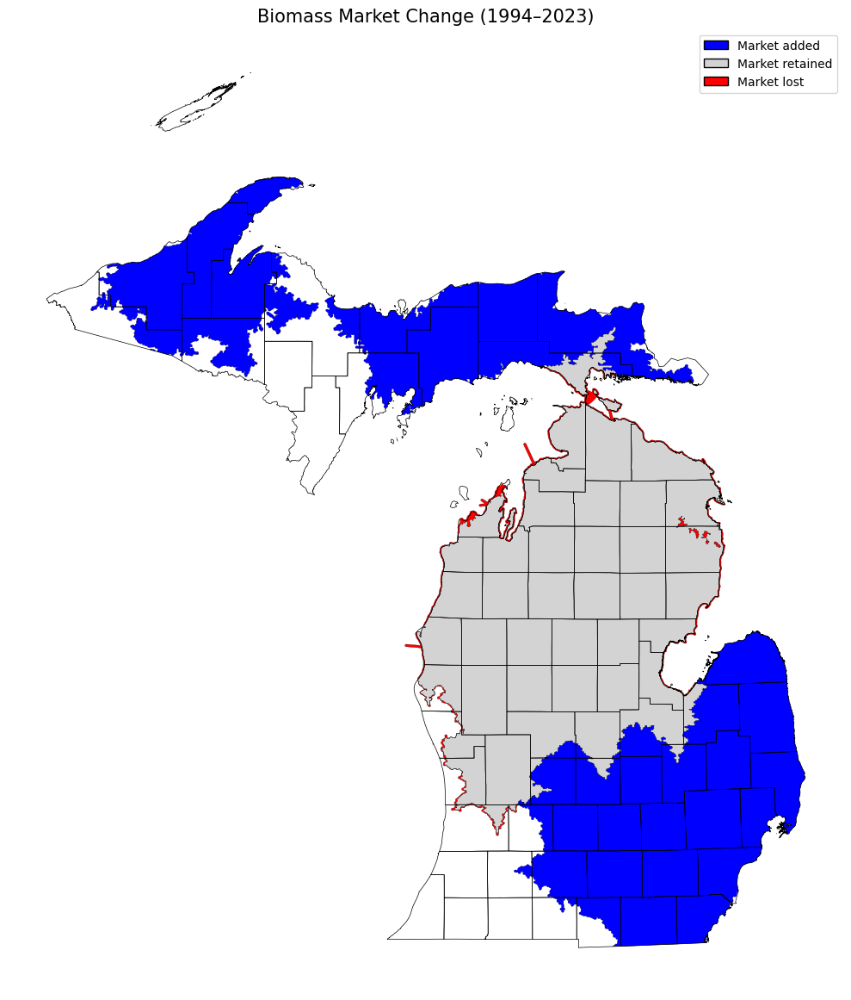

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "biomass_change_1994-2023.shp")  # <-- updated years
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (1994–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1994-2023.shp")  # <-- updated years

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 6,729,615.76 acres.
Polygon 'Market Loss' has a forest area of 39,738.78 acres.
Polygon 'Market Add' has a forest area of 6,245,701.34 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1994-2023.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 7984101.55 acres.
   White/Red/Jack Pine Group: 1664839.05 acres
   Spruce/Fir Group: 746504.21 acres
   Oak/Hickory Group: 1050.20 acres
   Elm/Ash/Cottonwood Group: 1559.85 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 5570055.58 acres

Polygon 'Market Loss' has a forest area of 42301.29 acres.
   White/Red/Jack Pine Group: 5266.43 acres
   Spruce/Fir Group: 3567.58 acres
   Aspen/Birch Group: 33467.28 acres

Polygon 'Market Add' has a forest area of 7135187.76 acres.
   White/Red/Jack Pine Group: 593746.98 acres
   Spruce/Fir Group: 1599356.22 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 29915.15 acres
   Elm/Ash/Cottonwood Group: 39289.69 acres
   Maple/Beech/Birch Group: 2582463.47 acres
   Aspen/Birch Group: 2290277.25 acres



# 2002-2023

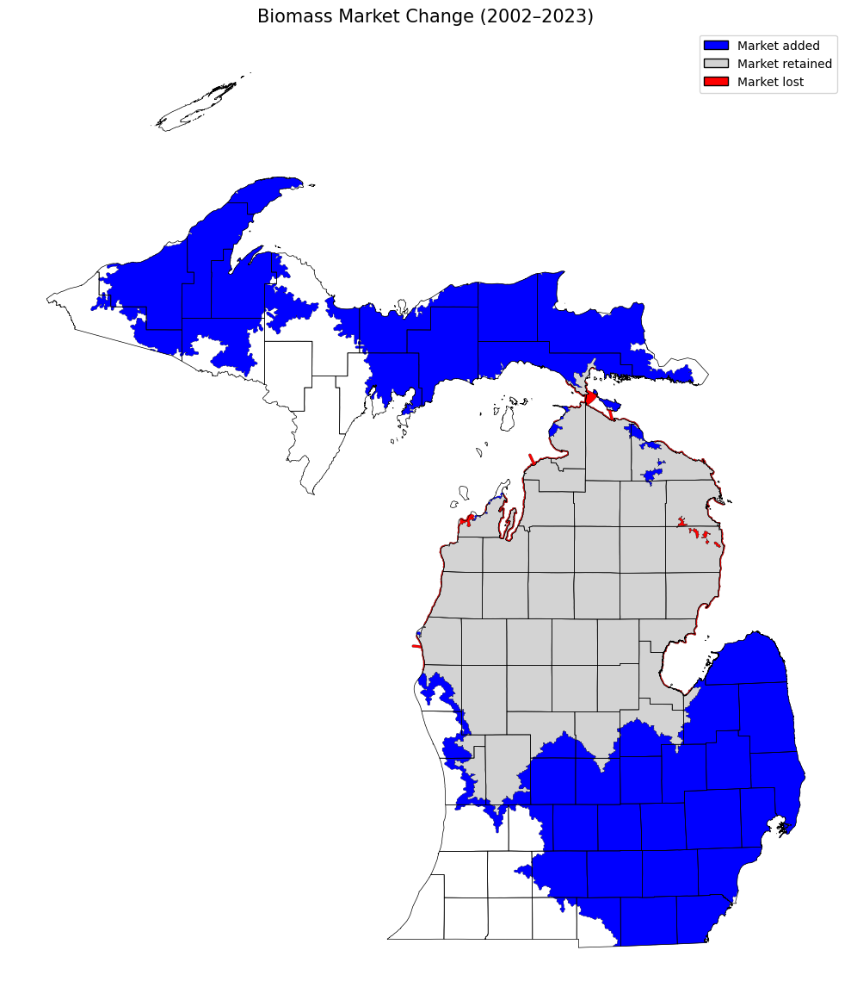

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "biomass_change_2002-2023.shp")  # <-- updated years
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (2002–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Paths from your existing Colab base_path
raster_path    = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_2002-2023.shp")  # <-- updated years

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² → acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # 'status' column
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = (np.isin(data, forest_values) & (data != nodata)) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 6,370,258.05 acres.
Polygon 'Market Loss' has a forest area of 14,475.66 acres.
Polygon 'Market Add' has a forest area of 6,605,059.05 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Use your Colab base_path
raster_path    = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_2002-2023.shp")  # <-- updated years

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 7559158.17 acres.
   White/Red/Jack Pine Group: 1631943.20 acres
   Spruce/Fir Group: 663754.92 acres
   Oak/Hickory Group: 942.09 acres
   Elm/Ash/Cottonwood Group: 1559.85 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 5260865.45 acres

Polygon 'Market Loss' has a forest area of 20092.73 acres.
   White/Red/Jack Pine Group: 1096.53 acres
   Spruce/Fir Group: 2455.61 acres
   Aspen/Birch Group: 16540.59 acres

Polygon 'Market Add' has a forest area of 7560131.14 acres.
   White/Red/Jack Pine Group: 626642.84 acres
   Spruce/Fir Group: 1682105.51 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 30023.26 acres
   Elm/Ash/Cottonwood Group: 39289.69 acres
   Maple/Beech/Birch Group: 2582463.47 acres
   Aspen/Birch Group: 2599467.38 acres



# Pulpwood

# 1985-1994

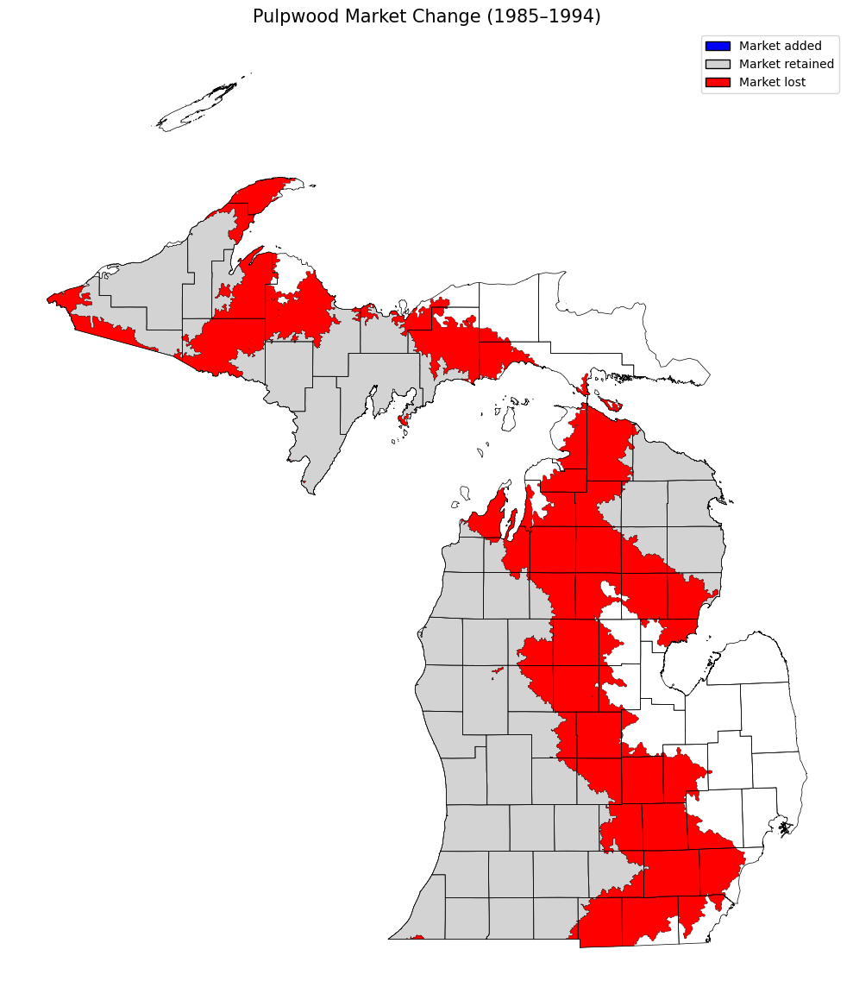

In [46]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "pulpwood_change_1985-1994.shp")  # <-- updated to pulpwood
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (1985–1994)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


# 1994-2002

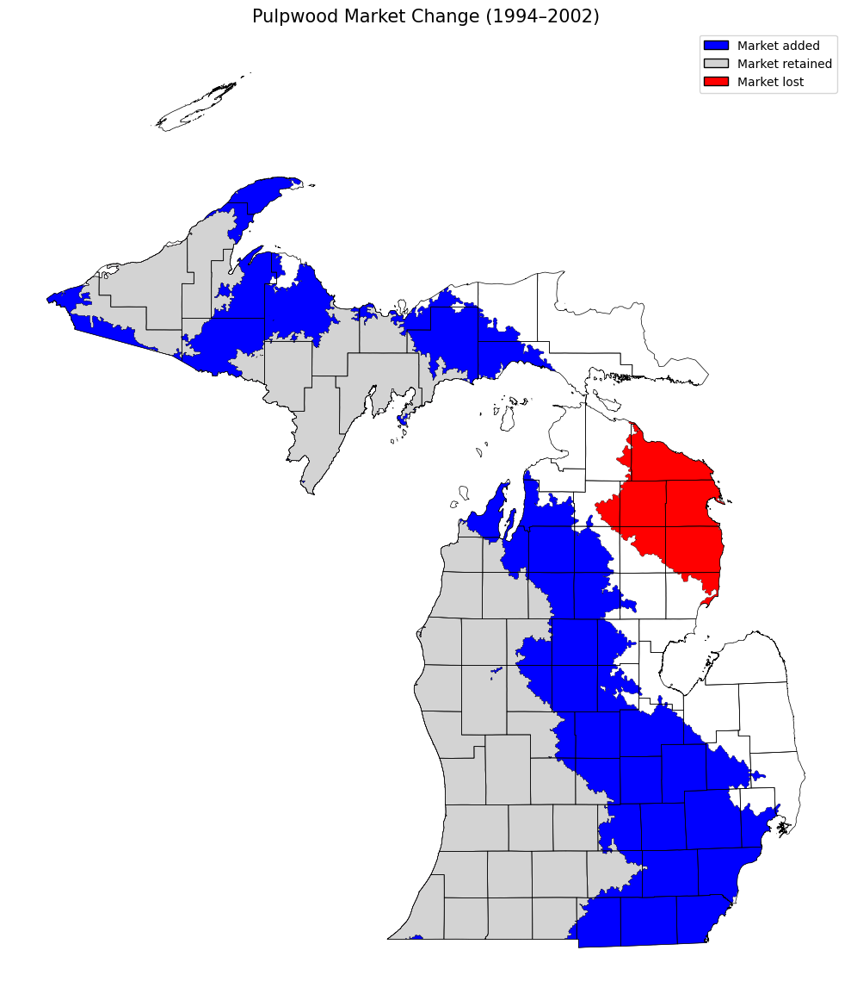

In [47]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "pulpwood_change_1994-2002.shp")  # <-- updated to pulpwood 1994–2002
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (1994–2002)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


# 2002-2018

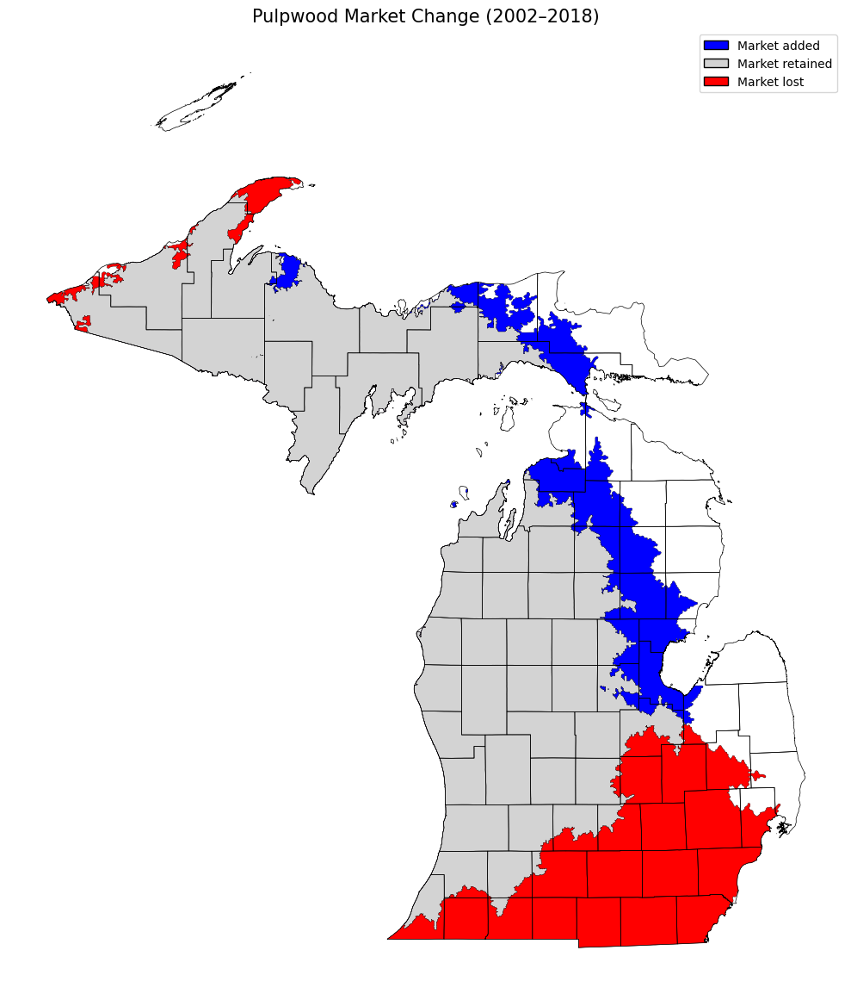

In [48]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "pulpwood_change_2002-2018.shp")  # <-- updated to pulpwood 2002–2018
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (2002–2018)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


# 2018-2023

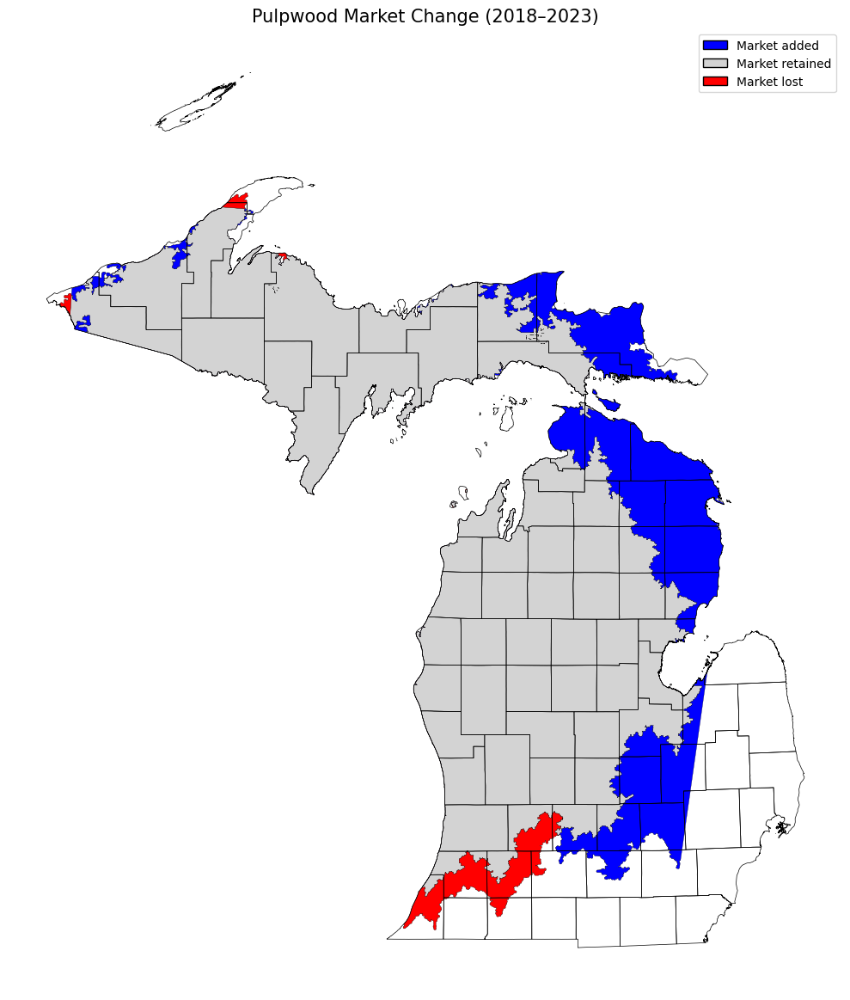

In [49]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "pulpwood_change_2018-2023.shp")  # <-- updated to pulpwood 2018–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (2018–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


# 1985-2023

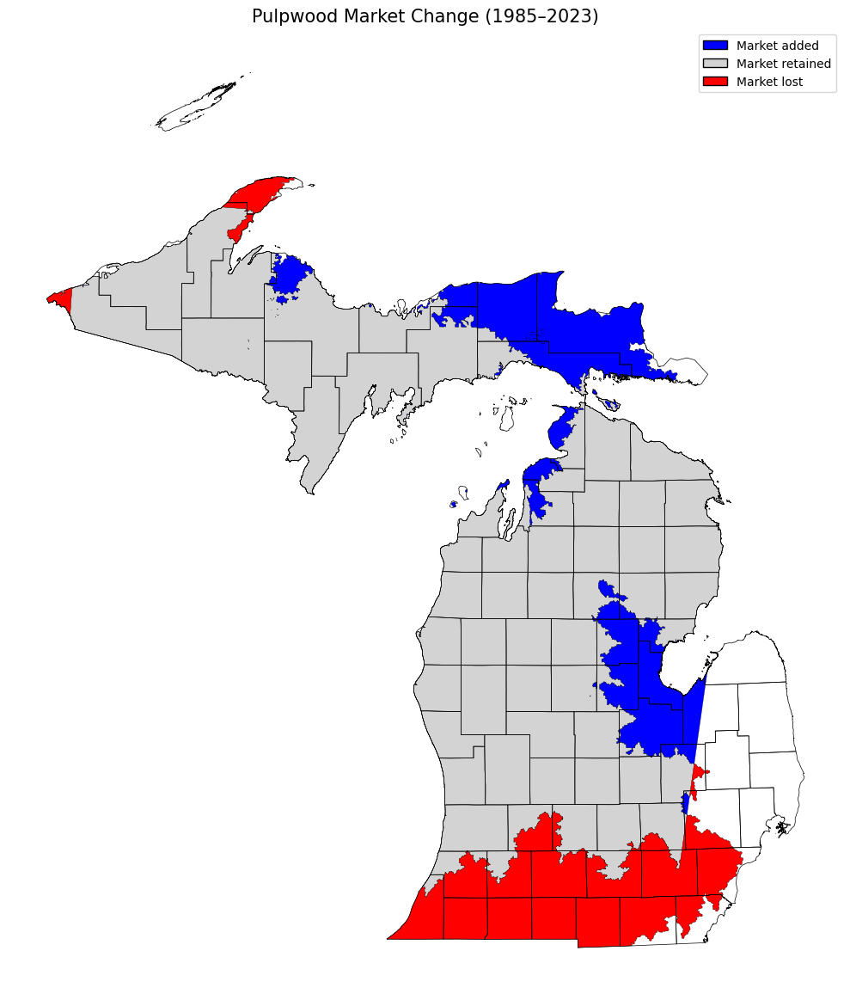

In [50]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "pulpwood_change_1985-2023.shp")  # <-- updated to pulpwood 1985–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (1985–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


# 1994-2023

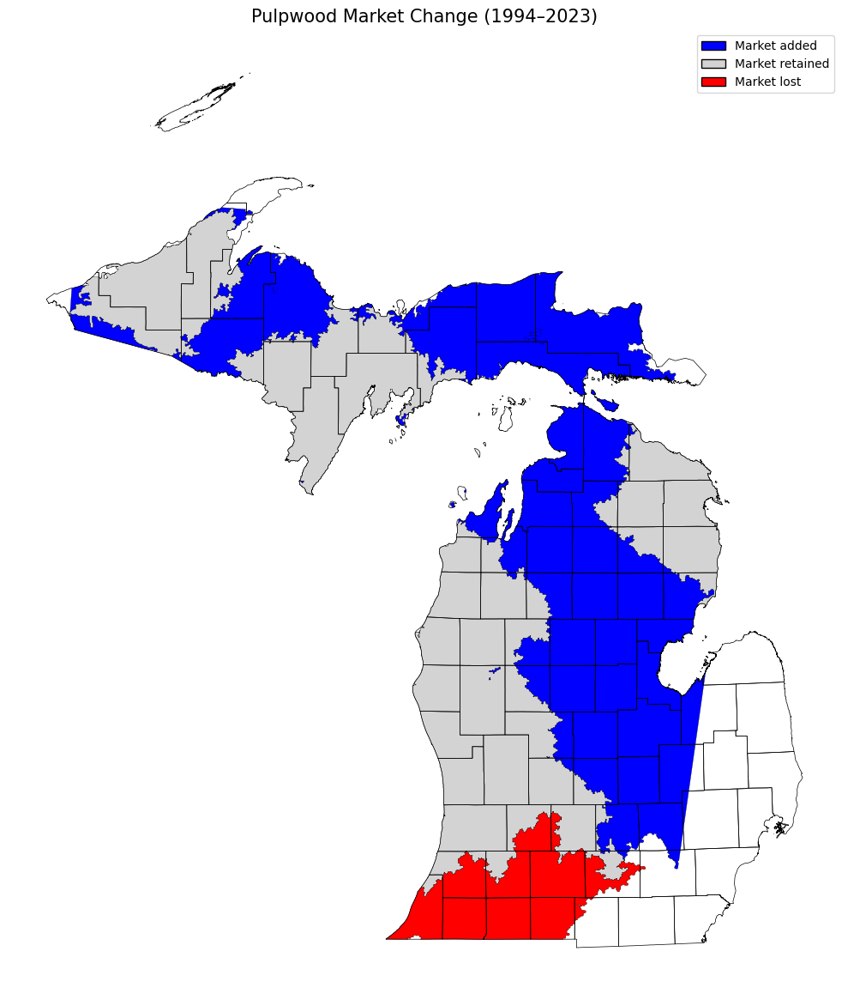

In [51]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "pulpwood_change_1994-2023.shp")  # <-- updated to pulpwood 1994–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (1994–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


# 2002-2023

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths (use Colab base_path) ---
change_fp   = os.path.join(base_path, "pulpwood_change_2002-2023.shp")  # <-- updated to pulpwood 2002–2023
counties_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Pulpwood Market Change (2002–2023)", fontsize=15)  # <-- updated title
ax.axis('off')
plt.tight_layout()
plt.show()


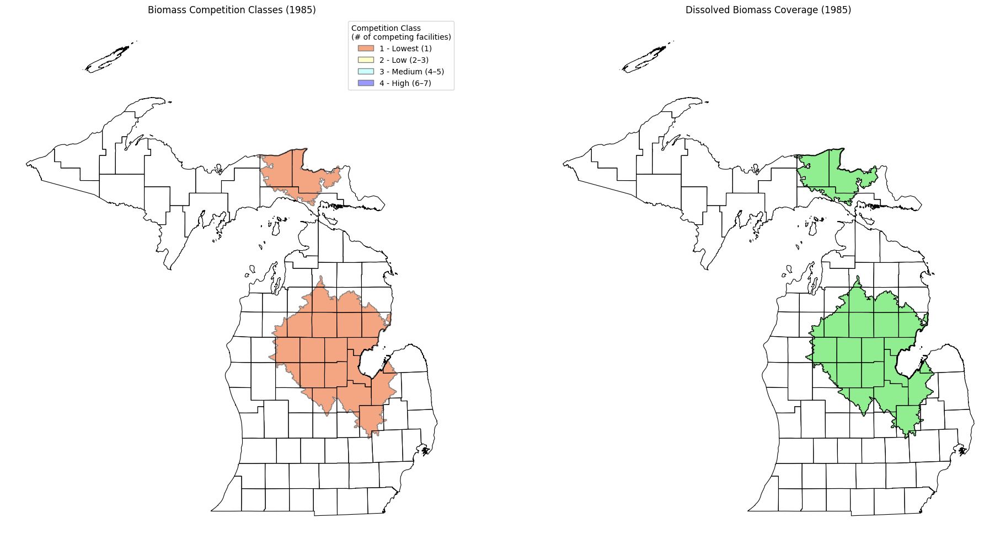

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths (use the base_path you already set in Colab) ---
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_1985_fp   = os.path.join(base_path, "biomass_hotspots_1985.shp")   # UNDISSOLVED
dissolved_1985_fp = os.path.join(base_path, "biomass_coverage_1985.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_1985_fp)    # original polygons with classes
gdf_union = gpd.read_file(dissolved_1985_fp)  # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map (update if 1985 has a different class scheme) ---
color_map = {
    "1 - Lowest (1985)": "#F4A582",
    "2 - Low (1985)":    "#FFFFCC",
    "3 - Medium (1985)": "#CCFFFF",
    "4 - High (1985)":   "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Left: original competition polygons
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (1985)")
axes[0].axis("off")

# Right: dissolved biomass area
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (1985)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


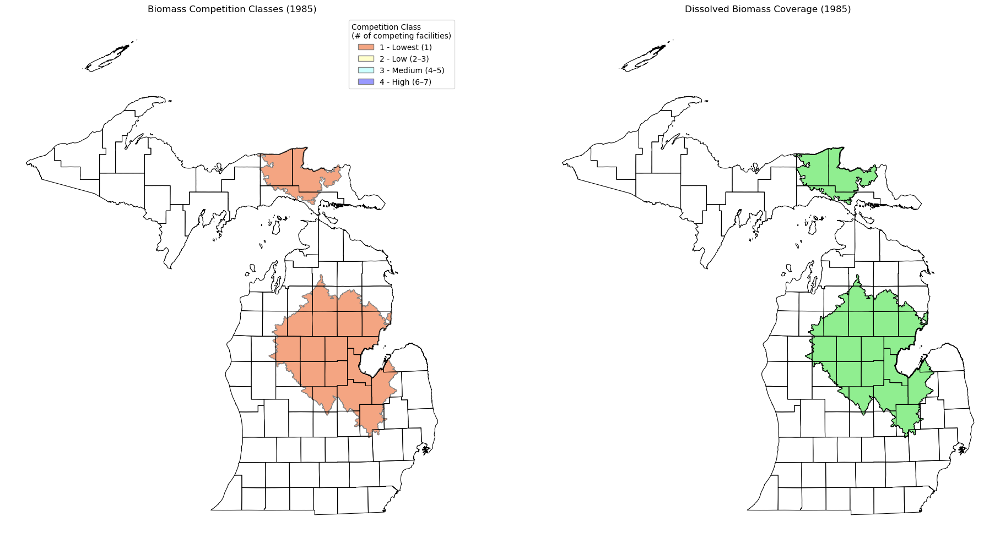

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Market Coverage August 11\Data"
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_1985_fp   = os.path.join(base_path, "biomass_hotspots_1985.shp")   # UNDISSOLVED
dissolved_1985_fp = os.path.join(base_path, "biomass_coverage_1985.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_1985_fp)   # original polygons with classes
gdf_union = gpd.read_file(dissolved_1985_fp) # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map (update if more classes exist in 1985 data) ---
color_map = {
    "1 - Lowest (1985)": "#F4A582",
    "2 - Low (1985)": "#FFFFCC",
    "3 - Medium (1985)": "#CCFFFF",
    "4 - High (1985)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original competition polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (1985)")
axes[0].axis("off")

# === Right: Dissolved biomass area ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (1985)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


1985

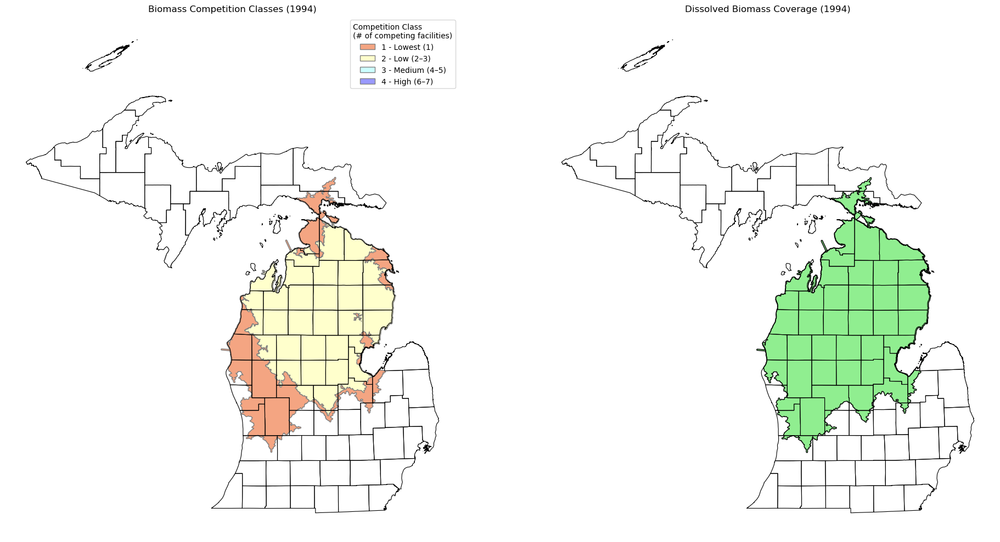

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Market Coverage August 11\Data"
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_1994_fp   = os.path.join(base_path, "biomass_hotspots_1994.shp")   # UNDISSOLVED
dissolved_1994_fp = os.path.join(base_path, "biomass_coverage_1994.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_1994_fp)   # original polygons with classes
gdf_union = gpd.read_file(dissolved_1994_fp) # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map (adjust if your 1994 data uses fewer/more classes) ---
color_map = {
    "1 - Lowest (1994)": "#F4A582",
    "2 - Low (1994)": "#FFFFCC",
    "3 - Medium (1994)": "#CCFFFF",
    "4 - High (1994)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original competition polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (1994)")
axes[0].axis("off")

# === Right: Dissolved biomass area ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (1994)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


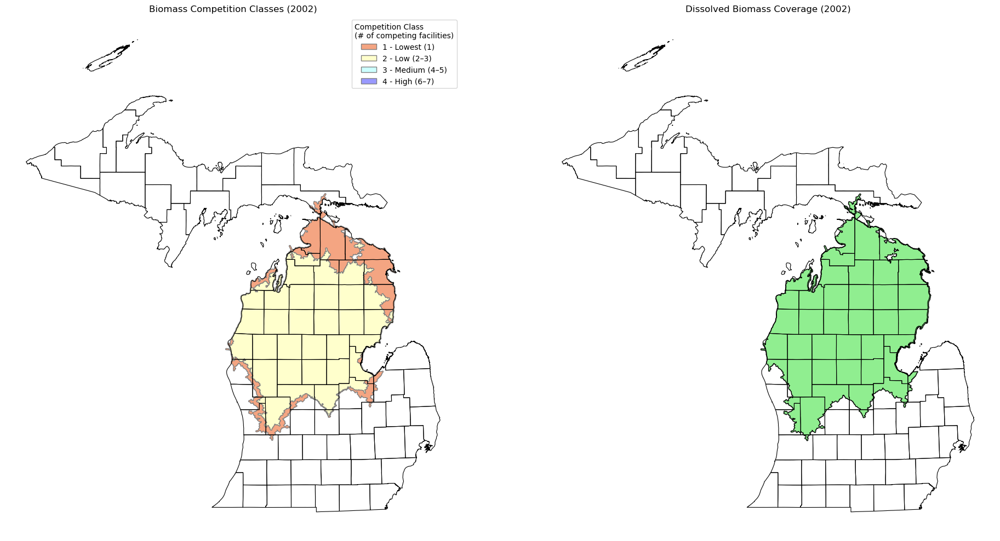

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Market Coverage August 11\Data"
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_2002_fp   = os.path.join(base_path, "biomass_hotspots_2002.shp")   # UNDISSOLVED
dissolved_2002_fp = os.path.join(base_path, "biomass_coverage_2002.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_2002_fp)   # original polygons with classes
gdf_union = gpd.read_file(dissolved_2002_fp) # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map (adjust if your 2002 data uses fewer/more classes) ---
color_map = {
    "1 - Lowest (2002)": "#F4A582",
    "2 - Low (2002)": "#FFFFCC",
    "3 - Medium (2002)": "#CCFFFF",
    "4 - High (2002)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original competition polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (2002)")
axes[0].axis("off")

# === Right: Dissolved biomass area ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (2002)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


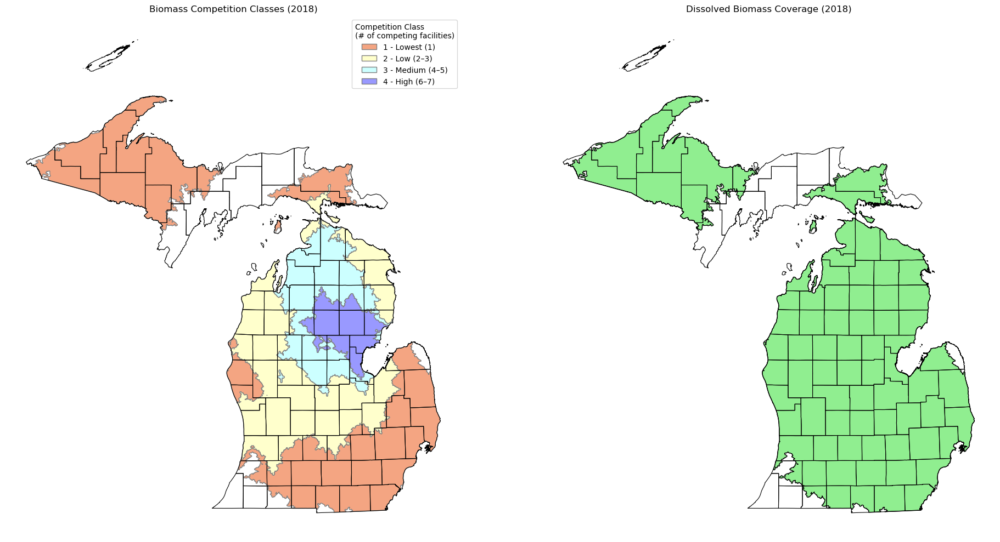

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Market Coverage August 11\Data"
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_2018_fp   = os.path.join(base_path, "biomass_hotspots_2018.shp")   # UNDISSOLVED
dissolved_2018_fp = os.path.join(base_path, "biomass_coverage_2018.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_2018_fp)   # original polygons with classes
gdf_union = gpd.read_file(dissolved_2018_fp) # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map (adjust if your 2018 data uses fewer/more classes) ---
color_map = {
    "1 - Lowest (2018)": "#F4A582",
    "2 - Low (2018)": "#FFFFCC",
    "3 - Medium (2018)": "#CCFFFF",
    "4 - High (2018)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original competition polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (2018)")
axes[0].axis("off")

# === Right: Dissolved biomass area ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (2018)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


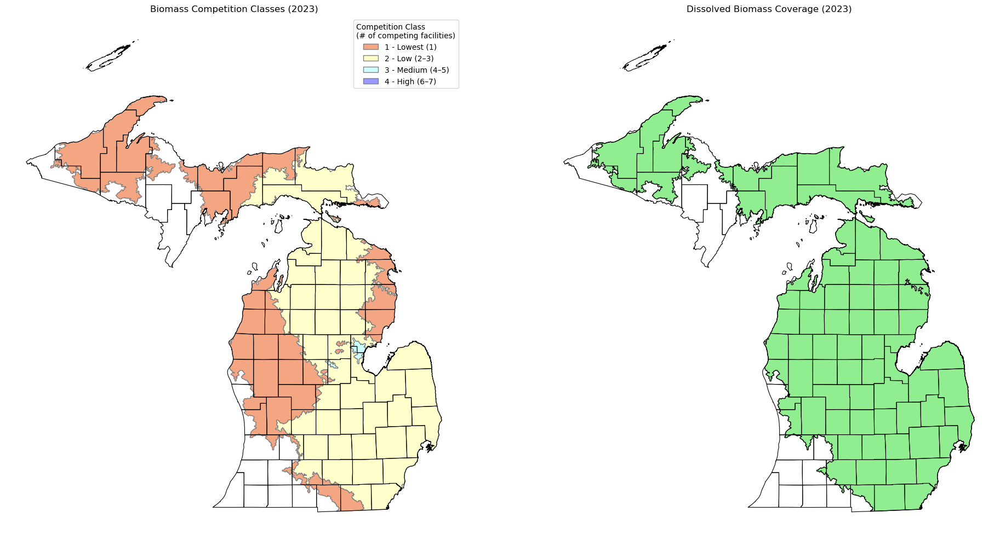

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Market Coverage August 11\Data"
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_2023_fp   = os.path.join(base_path, "biomass_hotspots_2023.shp")   # UNDISSOLVED
dissolved_2023_fp = os.path.join(base_path, "biomass_coverage_2023.shp")   # DISSOLVED

# --- Load data ---
gdf_mi    = gpd.read_file(michigan_fp)
gdf_bio   = gpd.read_file(biomass_2023_fp)   # original polygons with classes
gdf_union = gpd.read_file(dissolved_2023_fp) # dissolved polygon(s)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map for 4 competition classes ---
color_map = {
    "1 - Lowest (2023)": "#F4A582",
    "2 - Low (2023)": "#FFFFCC",
    "3 - Medium (2023)": "#CCFFFF",
    "4 - High (2023)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original competition polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (2023)")
axes[0].axis("off")

# === Right: Dissolved biomass area ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (2023)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


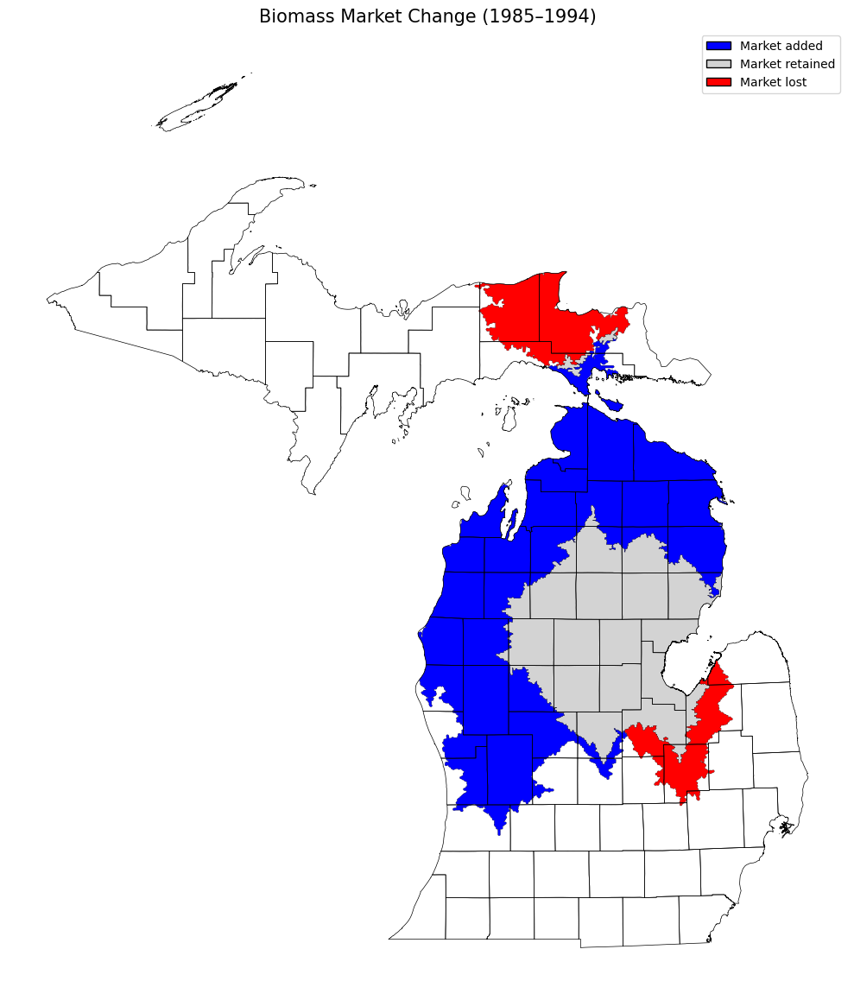

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths ---
base_dir   = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Market Coverage August 11\Data"
change_fp  = os.path.join(base_dir, "biomass_change_1985-1994.shp")
counties_fp = os.path.join(base_dir, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (1985–1994)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


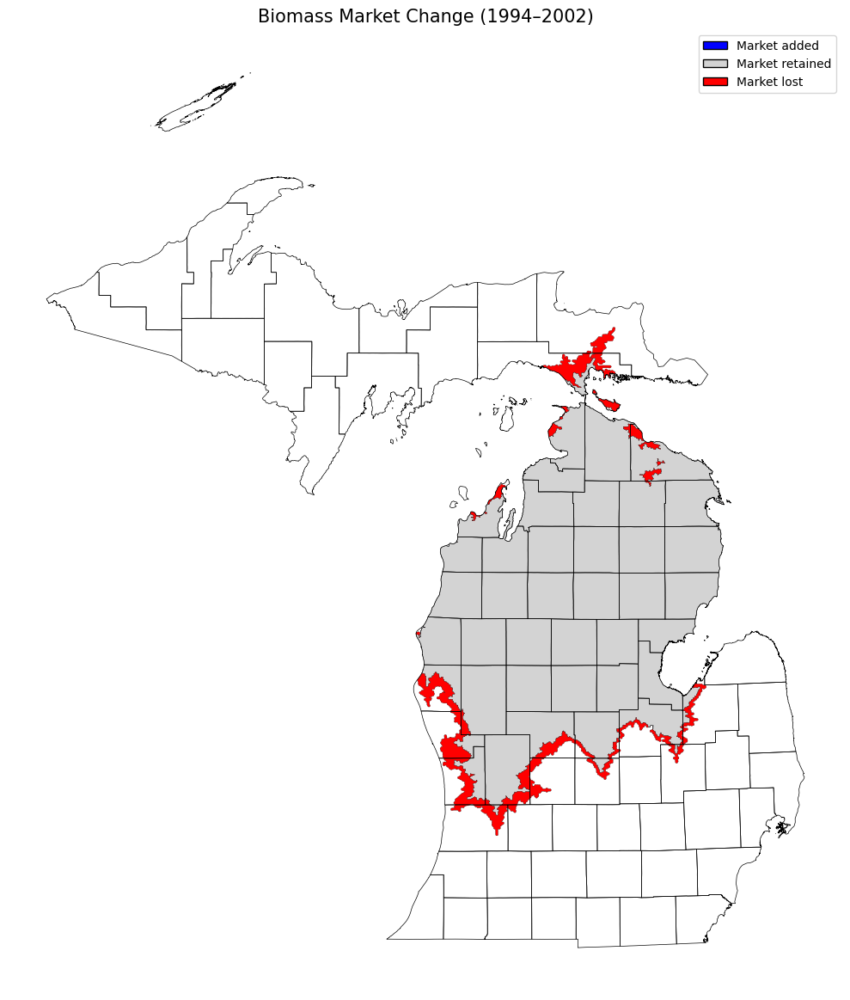

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths ---
base_dir   = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Market Coverage August 11\Data"
change_fp  = os.path.join(base_dir, "biomass_change_1994-2002.shp")
counties_fp = os.path.join(base_dir, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (1994–2002)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


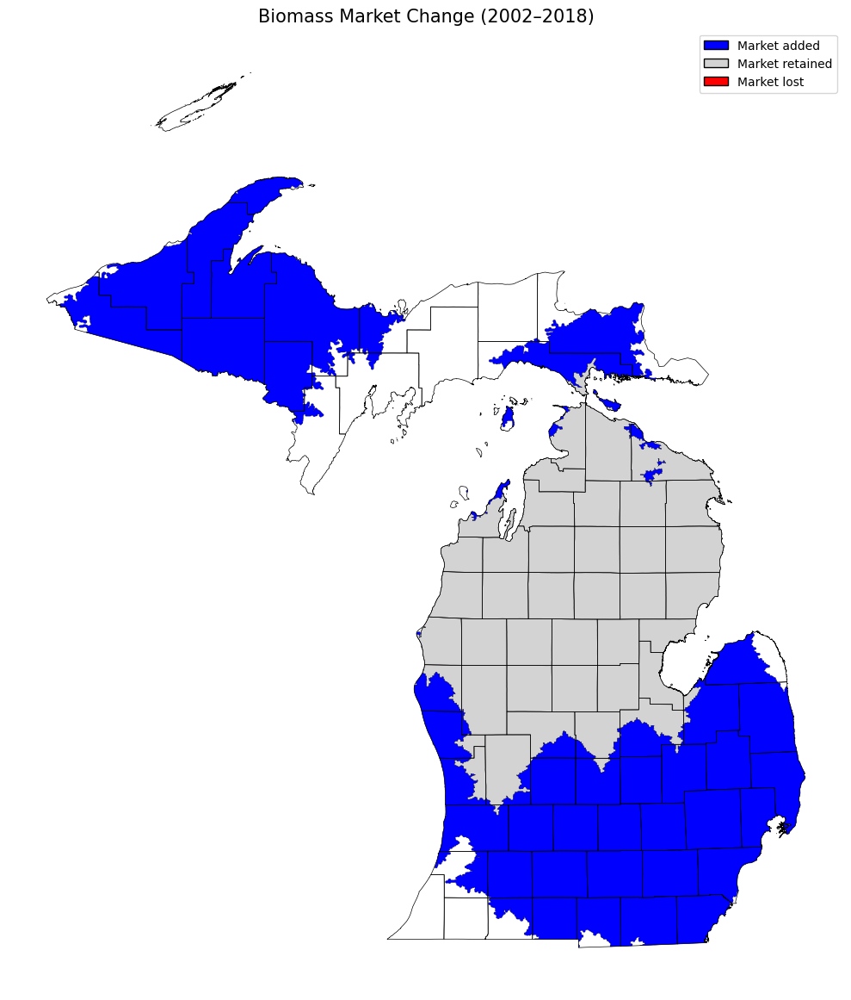

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths ---
base_dir   = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Market Coverage August 11\Data"
change_fp  = os.path.join(base_dir, "biomass_change_2002-2018.shp")
counties_fp = os.path.join(base_dir, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (2002–2018)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


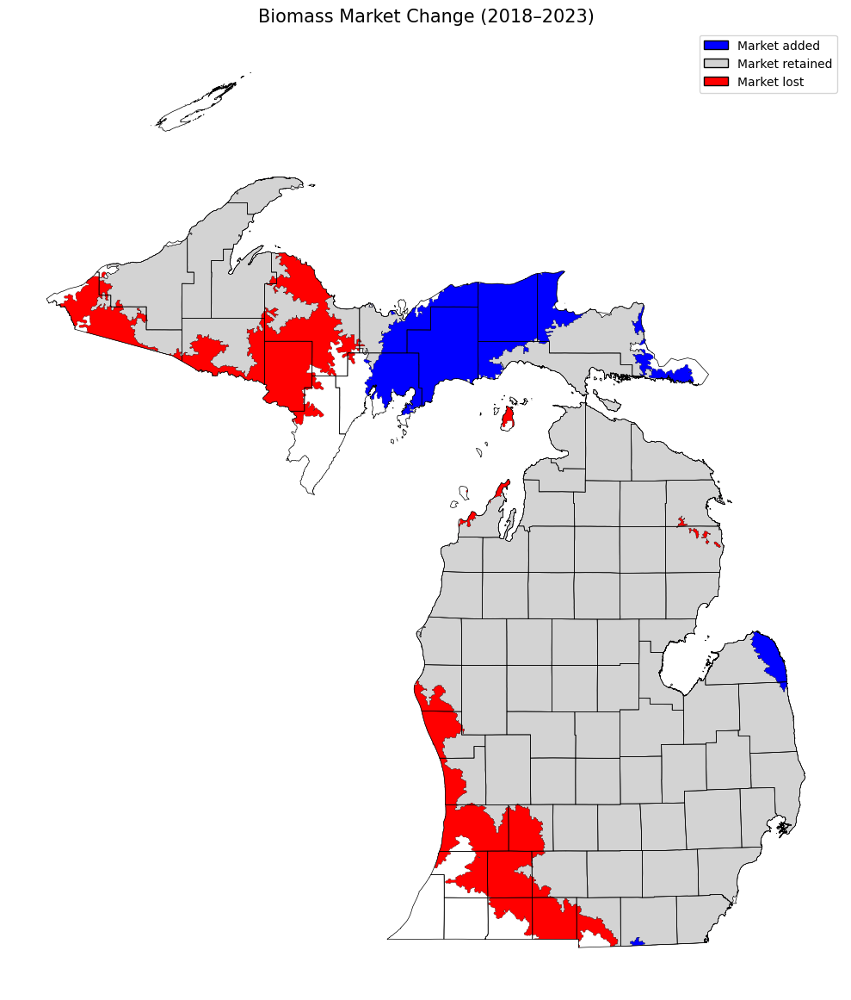

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths ---
base_dir   = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Market Coverage August 11\Data"
change_fp  = os.path.join(base_dir, "biomass_change_2018-2023.shp")
counties_fp = os.path.join(base_dir, "Counties_(v17a).shp")

# --- Load ---
gdf_change = gpd.read_file(change_fp)
gdf_mi     = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Subsets by status ---
retain = gdf_change[gdf_change["status"] == "Market Retain"]
loss   = gdf_change[gdf_change["status"] == "Market Loss"]
add    = gdf_change[gdf_change["status"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

# --- Legend ---
legend_elements = [
    Patch(facecolor='blue', edgecolor='black', label='Market added'),
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)

ax.set_title("Biomass Market Change (2018–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Local file paths (updated folder)
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Market Coverage August 11\Data"
raster_path = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1985-2023.shp")

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² to acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # Column name is 'status'
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = np.isin(data, forest_values) & (data != nodata) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 3,103,479.89 acres.
Polygon 'Market Loss' has a forest area of 8.90 acres.
Polygon 'Market Add' has a forest area of 9,871,837.21 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ File paths for biomass change 1985–2023 (updated folder)
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Market Coverage August 11\Data"
raster_path = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1985-2023.shp")

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")

            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 4031101.09 acres.
   White/Red/Jack Pine Group: 891832.83 acres
   Spruce/Fir Group: 643399.64 acres
   Oak/Hickory Group: 1034.75 acres
   Elm/Ash/Cottonwood Group: 231.66 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 2494509.53 acres

Polygon 'Market Loss' has a forest area of 108.11 acres.
   White/Red/Jack Pine Group: 108.11 acres

Polygon 'Market Add' has a forest area of 11087369.69 acres.
   White/Red/Jack Pine Group: 1366320.77 acres
   Spruce/Fir Group: 1702429.90 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 29915.15 acres
   Elm/Ash/Cottonwood Group: 40617.88 acres
   Maple/Beech/Birch Group: 2582293.58 acres
   Aspen/Birch Group: 5365653.41 acres



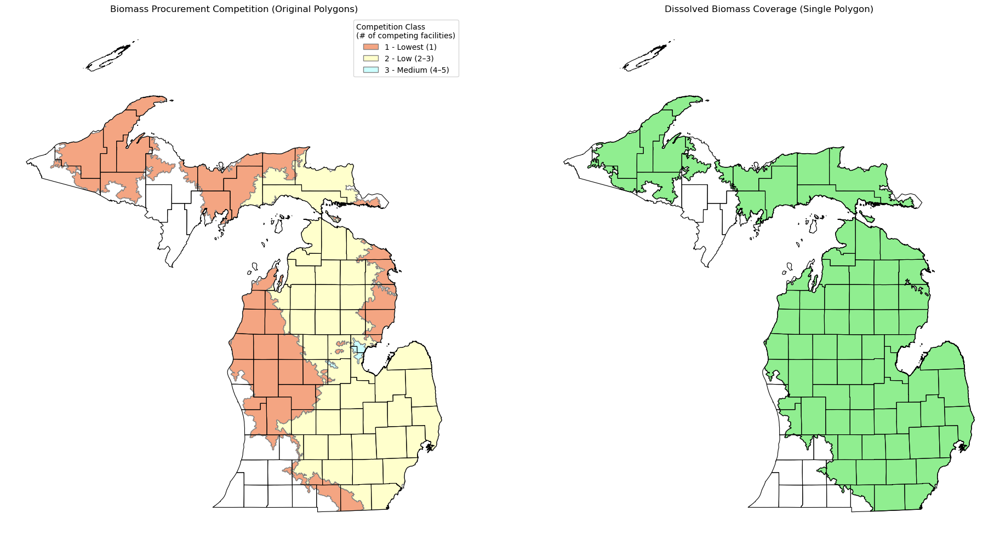

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# --- File paths ---
michigan_fp = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\Counties_(v17a).shp"
biomass_fp = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\biomass_hotspots_2023.shp"
dissolved_fp = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\biomass_coverage_2023.shp"

# --- Load data ---
gdf_mi = gpd.read_file(michigan_fp)
gdf_bio = gpd.read_file(biomass_fp)
gdf_union = gpd.read_file(dissolved_fp)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Color map for classes ---
color_map = {
    "1 - Lowest (2023)": "#F4A582",
    "2 - Low (2023)": "#FFFFCC",
    "3 - Medium (2023)": "#CCFFFF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left subplot: Original biomass hotspots ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# Add legend
legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Procurement Competition (Original Polygons)")
axes[0].axis("off")

# === Right subplot: Dissolved biomass coverage ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (Single Polygon)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


c:\Users\khanalna\AppData\Local\anaconda3\envs\colab_env\Lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'id' to 'id_1'
  ogr_write(


✅ Saved dissolved shapefile to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\biomass_coverage_2018.shp


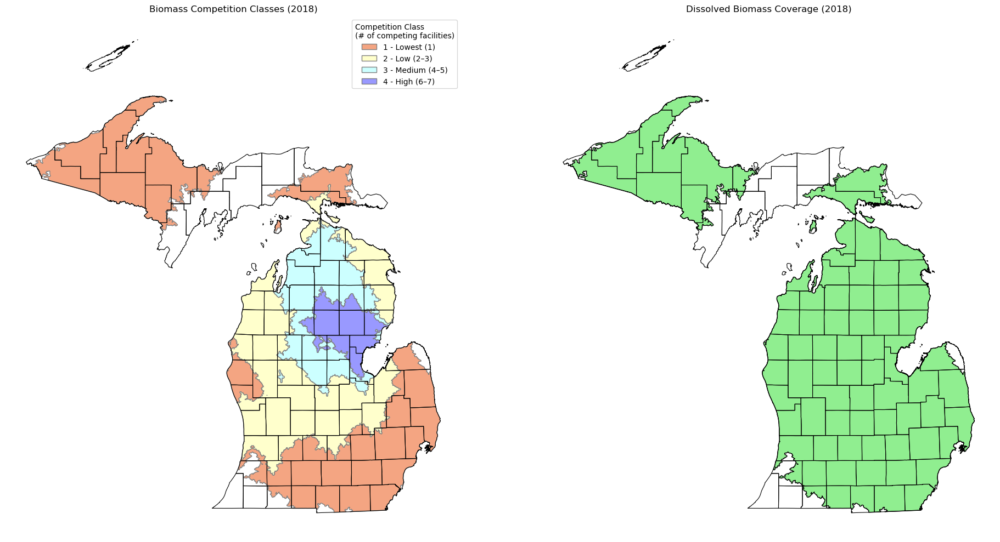

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")
biomass_2018_fp = os.path.join(base_path, "biomass_hotspots_2018.shp")
dissolved_2018_fp = os.path.join(base_path, "biomass_coverage_2018.shp")

# --- Load data ---
gdf_mi = gpd.read_file(michigan_fp)
gdf_bio = gpd.read_file(biomass_2018_fp)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)

# --- Dissolve into one polygon and save ---
gdf_union = gdf_bio.dissolve().reset_index(drop=True)
gdf_union["id"] = 1
gdf_union.to_file(dissolved_2018_fp)
print("✅ Saved dissolved shapefile to:", dissolved_2018_fp)

# --- Reload to confirm
gdf_union = gpd.read_file(dissolved_2018_fp)

# --- Updated color map (4 classes) ---
color_map = {
    "1 - Lowest (2018)": "#F4A582",
    "2 - Low (2018)": "#FFFFCC",
    "3 - Medium (2018)": "#CCFFFF",
    "4 - High (2018)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original competition polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# Updated legend
legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (2018)")
axes[0].axis("off")

# === Right: Dissolved biomass area ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (2018)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


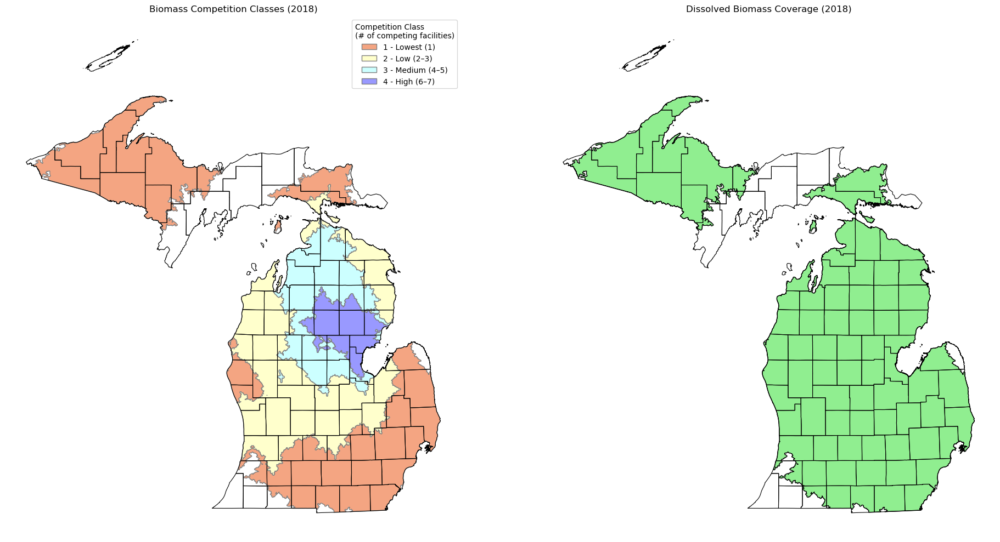

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Market Coverage August 11\Data"
michigan_fp       = os.path.join(base_path, "Counties_(v17a).shp")
biomass_2018_fp   = os.path.join(base_path, "biomass_hotspots_2018.shp")   # UNDISSOLVED
dissolved_2018_fp = os.path.join(base_path, "biomass_coverage_2018.shp")   # DISSOLVED

# --- Load data ---
gdf_mi   = gpd.read_file(michigan_fp)
gdf_bio  = gpd.read_file(biomass_2018_fp)   # original polygons with classes
gdf_union = gpd.read_file(dissolved_2018_fp) # dissolved single/multipolygon

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)
if gdf_union.crs != gdf_mi.crs:
    gdf_union = gdf_union.to_crs(gdf_mi.crs)

# --- Updated color map (4 classes) ---
color_map = {
    "1 - Lowest (2018)": "#F4A582",
    "2 - Low (2018)": "#FFFFCC",
    "3 - Medium (2018)": "#CCFFFF",
    "4 - High (2018)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original competition polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (2018)")
axes[0].axis("off")

# === Right: Dissolved biomass area ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (2018)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


c:\Users\khanalna\AppData\Local\anaconda3\envs\colab_env\Lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'id' to 'id_1'
  ogr_write(


✅ Saved dissolved shapefile to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\biomass_coverage_2002.shp


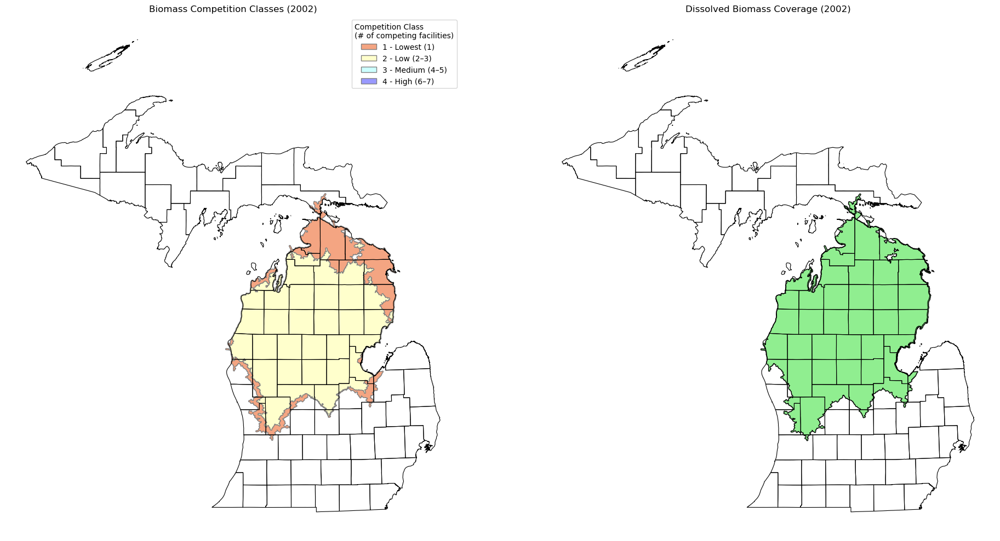

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")
biomass_2002_fp = os.path.join(base_path, "biomass_hotspots_2002.shp")
dissolved_2002_fp = os.path.join(base_path, "biomass_coverage_2002.shp")

# --- Load data ---
gdf_mi = gpd.read_file(michigan_fp)
gdf_bio = gpd.read_file(biomass_2002_fp)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)

# --- Dissolve into one polygon and save ---
gdf_union = gdf_bio.dissolve().reset_index(drop=True)
gdf_union["id"] = 1
gdf_union.to_file(dissolved_2002_fp)
print("✅ Saved dissolved shapefile to:", dissolved_2002_fp)

# --- Reload to confirm
gdf_union = gpd.read_file(dissolved_2002_fp)

# --- Color map for 4 competition classes ---
color_map = {
    "1 - Lowest (2002)": "#F4A582",
    "2 - Low (2002)": "#FFFFCC",
    "3 - Medium (2002)": "#CCFFFF",
    "4 - High (2002)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original polygon classes ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# Legend for 2002 classes
legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (2002)")
axes[0].axis("off")

# === Right: Dissolved coverage ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (2002)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


c:\Users\khanalna\AppData\Local\anaconda3\envs\colab_env\Lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'id' to 'id_1'
  ogr_write(


✅ Saved dissolved shapefile to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\biomass_coverage_1994.shp


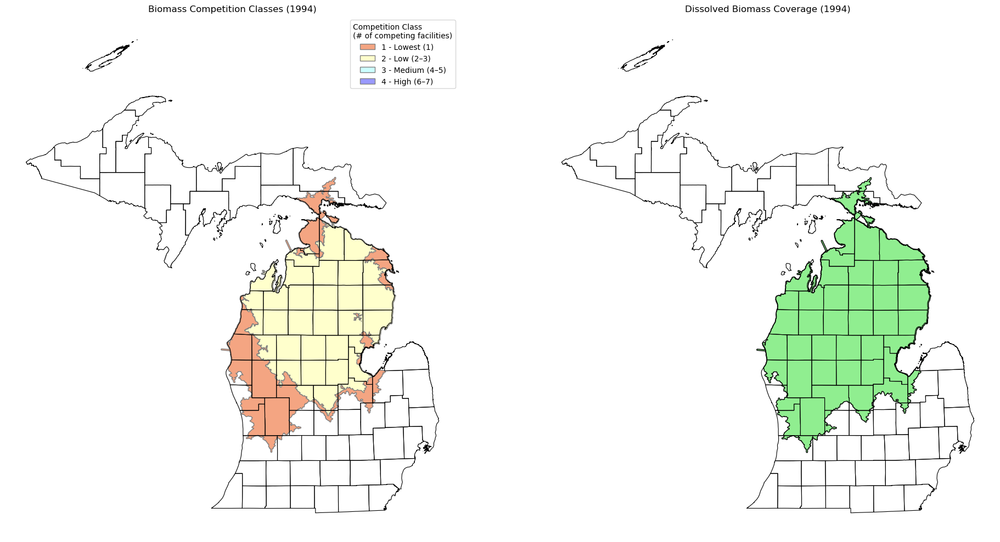

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")
biomass_1994_fp = os.path.join(base_path, "biomass_hotspots_1994.shp")
dissolved_1994_fp = os.path.join(base_path, "biomass_coverage_1994.shp")

# --- Load data ---
gdf_mi = gpd.read_file(michigan_fp)
gdf_bio = gpd.read_file(biomass_1994_fp)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)

# --- Dissolve into single polygon and save ---
gdf_union = gdf_bio.dissolve().reset_index(drop=True)
gdf_union["id"] = 1
gdf_union.to_file(dissolved_1994_fp)
print("✅ Saved dissolved shapefile to:", dissolved_1994_fp)

# --- Reload dissolved result
gdf_union = gpd.read_file(dissolved_1994_fp)

# --- Color map for 1994 competition classes ---
color_map = {
    "1 - Lowest (1994)": "#F4A582",
    "2 - Low (1994)": "#FFFFCC",
    "3 - Medium (1994)": "#CCFFFF",
    "4 - High (1994)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original classed polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# Legend
legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (1994)")
axes[0].axis("off")

# === Right: Dissolved area ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (1994)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


c:\Users\khanalna\AppData\Local\anaconda3\envs\colab_env\Lib\site-packages\pyogrio\raw.py:723: RuntimeWarning: Normalized/laundered field name: 'id' to 'id_1'
  ogr_write(


✅ Saved dissolved shapefile to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\biomass_coverage_1985.shp


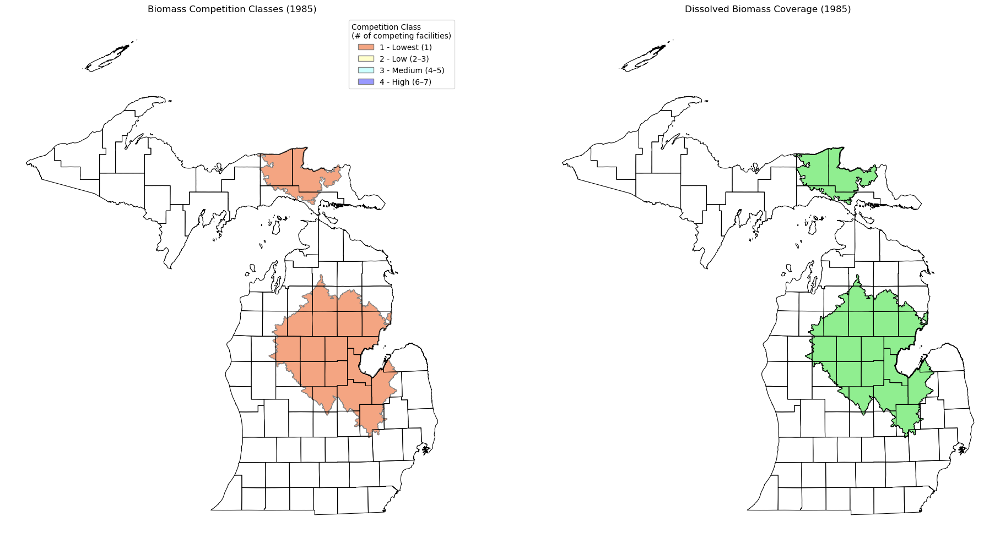

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")
biomass_1985_fp = os.path.join(base_path, "biomass_hotspots_1985.shp")
dissolved_1985_fp = os.path.join(base_path, "biomass_coverage_1985.shp")

# --- Load data ---
gdf_mi = gpd.read_file(michigan_fp)
gdf_bio = gpd.read_file(biomass_1985_fp)

# --- Reproject if needed ---
if gdf_bio.crs != gdf_mi.crs:
    gdf_bio = gdf_bio.to_crs(gdf_mi.crs)

# --- Dissolve into one polygon and save ---
gdf_union = gdf_bio.dissolve().reset_index(drop=True)
gdf_union["id"] = 1
gdf_union.to_file(dissolved_1985_fp)
print("✅ Saved dissolved shapefile to:", dissolved_1985_fp)

# --- Reload dissolved shapefile to confirm
gdf_union = gpd.read_file(dissolved_1985_fp)

# --- Color map for 1985 competition classes ---
color_map = {
    "1 - Lowest (1985)": "#F4A582",
    "2 - Low (1985)": "#FFFFCC",
    "3 - Medium (1985)": "#CCFFFF",
    "4 - High (1985)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_bio[gdf_bio["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# Legend
legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Biomass Competition Classes (1985)")
axes[0].axis("off")

# === Right: Dissolved polygon ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Biomass Coverage (1985)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [ ]:
import geopandas as gpd
import os

# --- Paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
coverage_1985_fp = os.path.join(base_path, "biomass_coverage_1985.shp")
coverage_2023_fp = os.path.join(base_path, "biomass_coverage_2023.shp")
output_fp = os.path.join(base_path, "biomass_change_1985-2023.shp")

# --- Load dissolved polygons ---
gdf_1985 = gpd.read_file(coverage_1985_fp)
gdf_2023 = gpd.read_file(coverage_2023_fp)

# --- Reproject to same CRS if needed ---
if gdf_1985.crs != gdf_2023.crs:
    gdf_2023 = gdf_2023.to_crs(gdf_1985.crs)

# --- Get geometries ---
geom_1985 = gdf_1985.unary_union
geom_2023 = gdf_2023.unary_union

# --- Market Retain (intersection) ---
retain = geom_1985.intersection(geom_2023)

# --- Market Loss (in 1985 but not in 2023) ---
loss = geom_1985.difference(geom_2023)

# --- Market Add (in 2023 but not in 1985) ---
add = geom_2023.difference(geom_1985)

# --- Build GeoDataFrame ---
gdf_out = gpd.GeoDataFrame({
    "status": ["Market Retain", "Market Loss", "Market Add"],
    "geometry": [retain, loss, add]
}, crs=gdf_1985.crs)

# --- Save output ---
gdf_out.to_file(output_fp)
print("✅ Saved to:", output_fp)


C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\2141952076.py:19: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_1985 = gdf_1985.unary_union
C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\2141952076.py:20: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_2023 = gdf_2023.unary_union


✅ Saved to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\biomass_change_1985-2023.shp


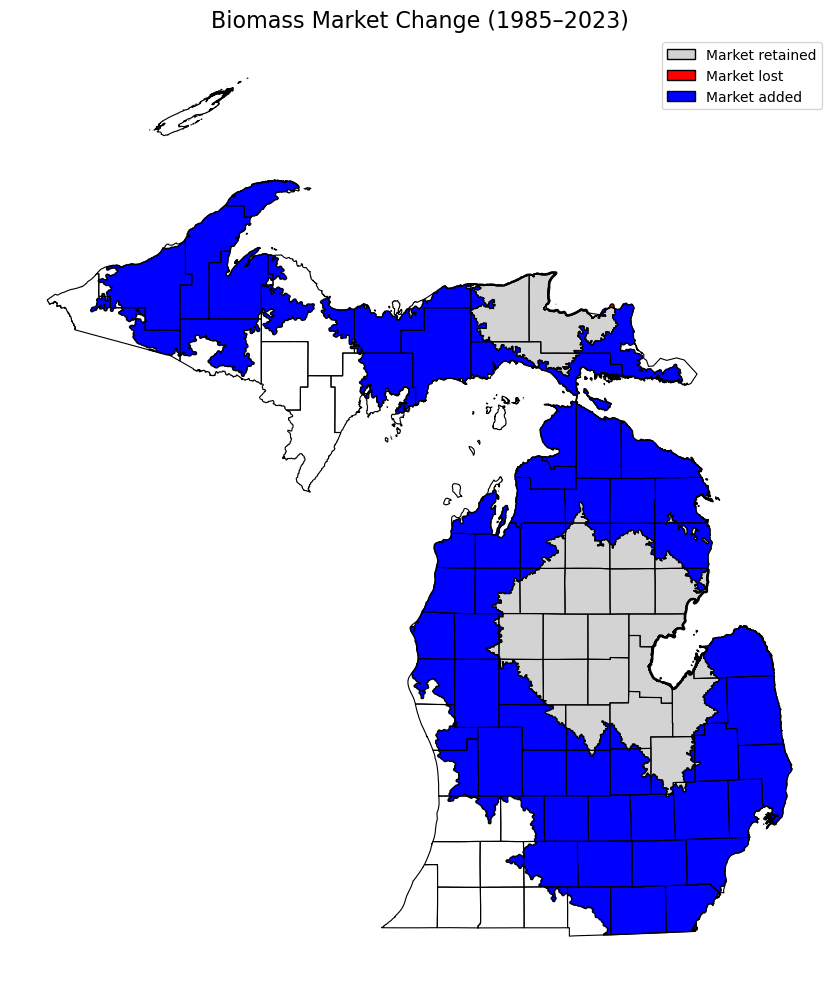

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
change_fp = os.path.join(base_path, "biomass_change_1985-2023.shp")
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load data ---
gdf_change = gpd.read_file(change_fp)
gdf_mi = gpd.read_file(michigan_fp)

# --- Reproject if needed ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Define color mapping ---
color_map = {
    "Market Retain": "#D3D3D3",  # Light gray
    "Market Loss": "#FF0000",    # Red
    "Market Add": "#0000FF"      # Blue
}

# --- Plot ---
fig, ax = plt.subplots(figsize=(12, 10))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.8)

# Plot each class
for label, color in color_map.items():
    subset = gdf_change[gdf_change["status"] == label]
    if not subset.empty:
        subset.plot(ax=ax, color=color, edgecolor='black')

# --- Legend ---
legend_elements = [
    Patch(facecolor="#D3D3D3", edgecolor='black', label="Market retained"),
    Patch(facecolor="#FF0000", edgecolor='black', label="Market lost"),
    Patch(facecolor="#0000FF", edgecolor='black', label="Market added")
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True)

# --- Final touches ---
plt.title("Biomass Market Change (1985–2023)", fontsize=16)
plt.axis("off")
plt.tight_layout()
plt.show()


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj
import os

# ✅ Local file paths
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
raster_path = os.path.join(base_path, "lulc2001.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1985-2023.shp")

# ✅ Forest land cover class codes
forest_values = [31, 41, 42, 43, 52, 71, 81, 95]  # Modify if needed

# ✅ Open raster
with rasterio.open(raster_path) as src:
    pixel_area_acres = (src.res[0] * abs(src.res[1])) * 0.000247105  # m² to acres
    nodata = src.nodata
    raster_crs = src.crs

    # ✅ Open shapefile
    with fiona.open(shapefile_path, 'r') as shp:
        shp_crs = shp.crs

        # Function to reproject geometries if needed
        def reproject_geom(geom, src_crs, dst_crs):
            transformer = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(transformer, shape(geom)))

        # ✅ Loop through features
        for feature in shp:
            polygon_label = feature["properties"].get("status", "unknown")  # Column name is 'status'
            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            data = out_image[0]
            forest_mask = np.isin(data, forest_values) & (data != nodata) if nodata is not None else np.isin(data, forest_values)
            forest_area_acres = np.sum(forest_mask) * pixel_area_acres

            print(f"Polygon '{polygon_label}' has a forest area of {forest_area_acres:,.2f} acres.")


Polygon 'Market Retain' has a forest area of 3,103,479.89 acres.
Polygon 'Market Loss' has a forest area of 8.90 acres.
Polygon 'Market Add' has a forest area of 9,871,837.21 acres.


In [ ]:
import rasterio
from rasterio.mask import mask
import fiona
import numpy as np
from shapely.geometry import shape, mapping
from shapely.ops import transform
import pyproj

# ✅ Colab paths
# ✅ File paths for biomass change 1985–2023
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
raster_path = os.path.join(base_path, "forest_cover_2019.tif")
shapefile_path = os.path.join(base_path, "biomass_change_1985-2023.shp")

# ✅ Forest group code mapping
forest_type_mapping = {
    100: "White/Red/Jack Pine Group",
    120: "Spruce/Fir Group",
    140: "Longleaf/Slash Pine Group",
    160: "Loblolly/Shortleaf Pine Group",
    180: "Pinyon/Juniper Group",
    200: "Douglas-fir Group",
    220: "Ponderosa Pine Group",
    240: "Western White Pine Group",
    260: "Fir/Spruce/Mountain Hemlock Group",
    280: "Lodgepole Pine Group",
    300: "Hemlock/Sitka Spruce Group",
    320: "Western Larch Group",
    340: "Redwood Group",
    360: "Other Western Softwood Group",
    370: "California Mixed Conifer Group",
    380: "Exotic Softwoods Group",
    400: "Oak/Pine Group",
    500: "Oak/Hickory Group",
    600: "Oak/Gum/Cypress Group",
    700: "Elm/Ash/Cottonwood Group",
    800: "Maple/Beech/Birch Group",
    900: "Aspen/Birch Group",
    910: "Alder/Maple Group",
    920: "Western Oak Group",
    940: "Tanoak/Laurel Group",
    950: "Other Western Hardwoods Group",
    980: "Tropical Hardwoods Group",
    990: "Exotic Hardwoods Group"
}

# ✅ Open and process raster and shapefile
with rasterio.open(raster_path) as src:
    pixel_width = src.transform[0]
    pixel_height = abs(src.transform[4])
    pixel_area_sq_m = pixel_width * pixel_height
    pixel_area_acres = pixel_area_sq_m * 0.000247105
    nodata = src.nodata
    raster_crs = src.crs

    with fiona.open(shapefile_path, 'r') as shapefile:
        shp_crs = shapefile.crs

        def reproject_geom(geom, src_crs, dst_crs):
            project = pyproj.Transformer.from_crs(src_crs, dst_crs, always_xy=True).transform
            return mapping(transform(project, shape(geom)))

        for feature in shapefile:
            polygon_label = feature["properties"].get("status", "unknown")

            geom = feature["geometry"]

            if shp_crs != raster_crs:
                geom = reproject_geom(geom, shp_crs, raster_crs)

            try:
                out_image, out_transform = mask(src, [geom], crop=True)
            except ValueError as e:
                if "do not overlap" in str(e):
                    print(f"Polygon '{polygon_label}' does not overlap the raster. Skipping...")
                    continue
                else:
                    raise

            out_data = out_image[0]

            if nodata is not None:
                valid_data = out_data[out_data != nodata]
            else:
                valid_data = out_data

            unique_types, pixel_counts = np.unique(valid_data, return_counts=True)

            forest_type_areas_acres = {
                forest_type_mapping.get(forest_type): count * pixel_area_acres
                for forest_type, count in zip(unique_types, pixel_counts)
                if forest_type_mapping.get(forest_type) is not None
            }

            total_area_acres = sum(forest_type_areas_acres.values())

            print(f"Polygon '{polygon_label}' has a forest area of {total_area_acres:.2f} acres.")
            for forest_type, area in forest_type_areas_acres.items():
                print(f"   {forest_type}: {area:.2f} acres")
            print()


Polygon 'Market Retain' has a forest area of 4031101.09 acres.
   White/Red/Jack Pine Group: 891832.83 acres
   Spruce/Fir Group: 643399.64 acres
   Oak/Hickory Group: 1034.75 acres
   Elm/Ash/Cottonwood Group: 231.66 acres
   Maple/Beech/Birch Group: 92.66 acres
   Aspen/Birch Group: 2494509.53 acres

Polygon 'Market Loss' has a forest area of 108.11 acres.
   White/Red/Jack Pine Group: 108.11 acres

Polygon 'Market Add' has a forest area of 11087369.69 acres.
   White/Red/Jack Pine Group: 1366320.77 acres
   Spruce/Fir Group: 1702429.90 acres
   Exotic Softwoods Group: 139.00 acres
   Oak/Hickory Group: 29915.15 acres
   Elm/Ash/Cottonwood Group: 40617.88 acres
   Maple/Beech/Birch Group: 2582293.58 acres
   Aspen/Birch Group: 5365653.41 acres



C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\3564745032.py:25: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_1994 = gdf_1994.unary_union
C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\3564745032.py:26: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_2023 = gdf_2023.unary_union


✅ Shapefile saved to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\biomass_change_1994-2023.shp


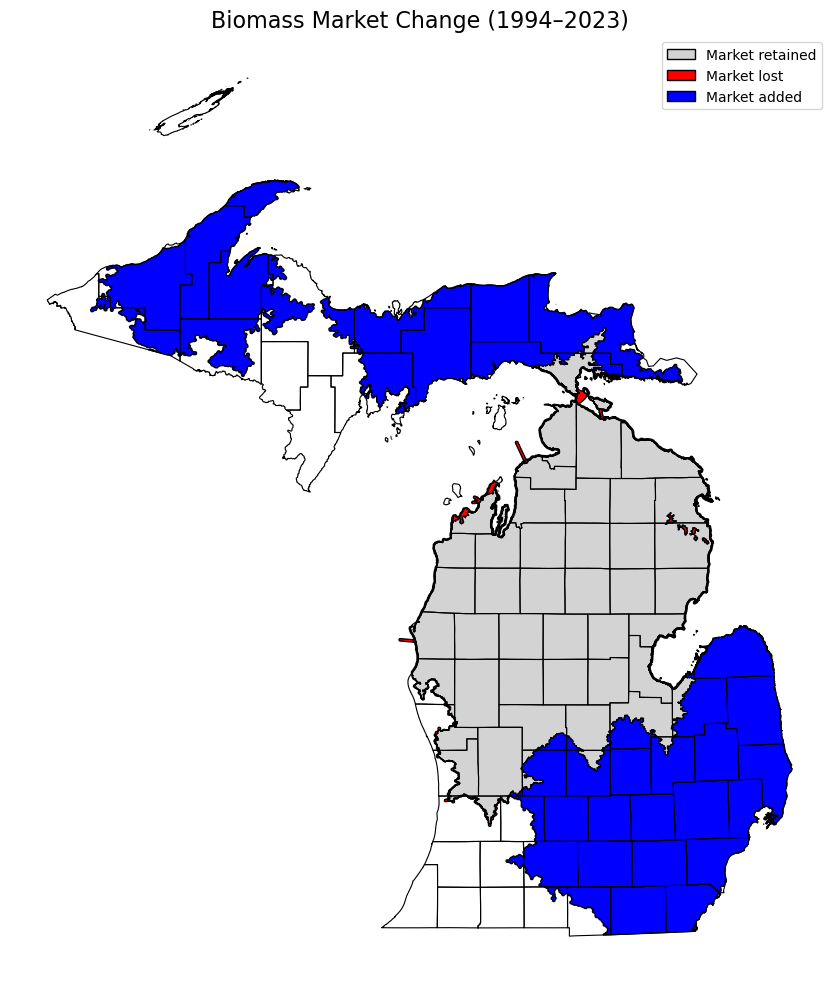

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
coverage_1994_fp = os.path.join(base_path, "biomass_coverage_1994.shp")
coverage_2023_fp = os.path.join(base_path, "biomass_coverage_2023.shp")
change_fp = os.path.join(base_path, "biomass_change_1994-2023.shp")
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load input data ---
gdf_1994 = gpd.read_file(coverage_1994_fp)
gdf_2023 = gpd.read_file(coverage_2023_fp)
gdf_mi = gpd.read_file(michigan_fp)

# --- Reproject if needed ---
if gdf_1994.crs != gdf_2023.crs:
    gdf_2023 = gdf_2023.to_crs(gdf_1994.crs)
if gdf_1994.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_1994.crs)

# --- Geometry union ---
geom_1994 = gdf_1994.unary_union
geom_2023 = gdf_2023.unary_union

# --- Calculate changes ---
retain = geom_1994.intersection(geom_2023)
loss = geom_1994.difference(geom_2023)
add = geom_2023.difference(geom_1994)

# --- Build and save GeoDataFrame ---
gdf_change = gpd.GeoDataFrame({
    "status": ["Market Retain", "Market Loss", "Market Add"],
    "geometry": [retain, loss, add]
}, crs=gdf_1994.crs)

gdf_change.to_file(change_fp)
print("✅ Shapefile saved to:", change_fp)

# --- Color mapping ---
color_map = {
    "Market Retain": "#D3D3D3",
    "Market Loss": "#FF0000",
    "Market Add": "#0000FF"
}

# --- Plot ---
fig, ax = plt.subplots(figsize=(12, 10))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.8)

for status, color in color_map.items():
    gdf_change[gdf_change["status"] == status].plot(ax=ax, color=color, edgecolor='black')

# --- Legend ---
legend_elements = [
    Patch(facecolor=color_map["Market Retain"], edgecolor='black', label="Market retained"),
    Patch(facecolor=color_map["Market Loss"], edgecolor='black', label="Market lost"),
    Patch(facecolor=color_map["Market Add"], edgecolor='black', label="Market added")
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True)
ax.set_title("Biomass Market Change (1994–2023)", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()


C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\2515897622.py:25: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_2002 = gdf_2002.unary_union
C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\2515897622.py:26: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_2023 = gdf_2023.unary_union


✅ Shapefile saved to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\biomass_change_2002-2023.shp


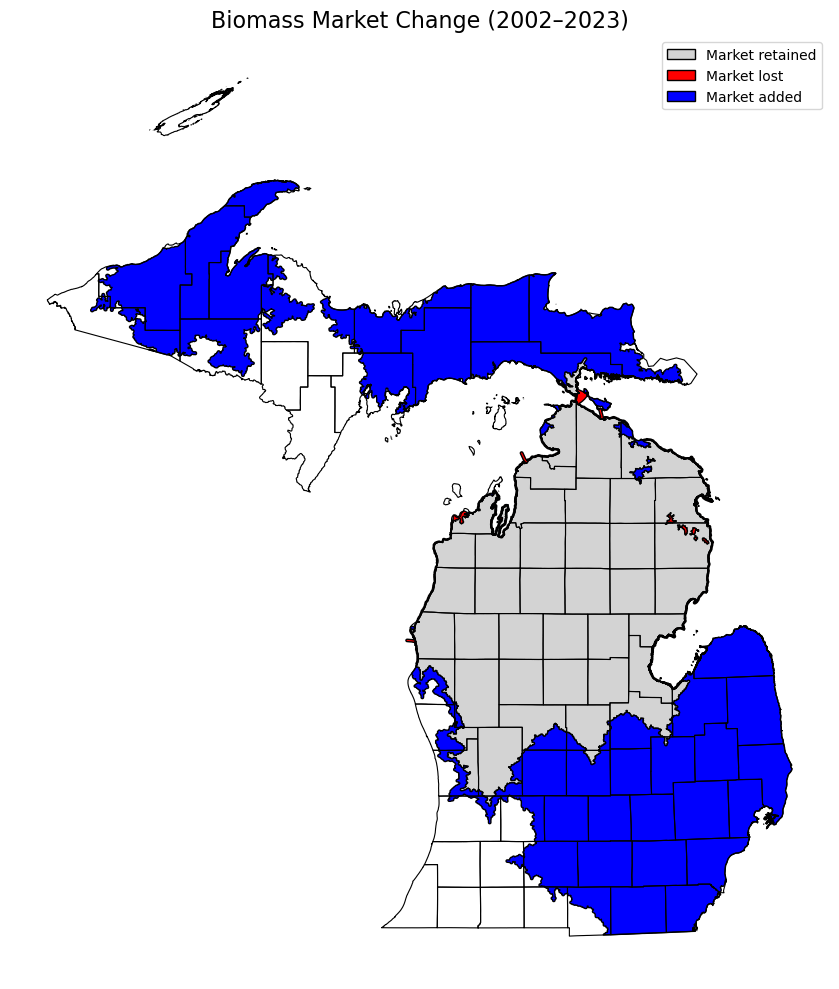

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
coverage_2002_fp = os.path.join(base_path, "biomass_coverage_2002.shp")
coverage_2023_fp = os.path.join(base_path, "biomass_coverage_2023.shp")
change_fp = os.path.join(base_path, "biomass_change_2002-2023.shp")
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load input data ---
gdf_2002 = gpd.read_file(coverage_2002_fp)
gdf_2023 = gpd.read_file(coverage_2023_fp)
gdf_mi = gpd.read_file(michigan_fp)

# --- Reproject if needed ---
if gdf_2002.crs != gdf_2023.crs:
    gdf_2023 = gdf_2023.to_crs(gdf_2002.crs)
if gdf_2002.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_2002.crs)

# --- Geometry union ---
geom_2002 = gdf_2002.unary_union
geom_2023 = gdf_2023.unary_union

# --- Calculate change types ---
retain = geom_2002.intersection(geom_2023)
loss = geom_2002.difference(geom_2023)
add = geom_2023.difference(geom_2002)

# --- Build and save GeoDataFrame ---
gdf_change = gpd.GeoDataFrame({
    "status": ["Market Retain", "Market Loss", "Market Add"],
    "geometry": [retain, loss, add]
}, crs=gdf_2002.crs)

gdf_change.to_file(change_fp)
print("✅ Shapefile saved to:", change_fp)

# --- Color mapping ---
color_map = {
    "Market Retain": "#D3D3D3",  # Light gray
    "Market Loss": "#FF0000",    # Red
    "Market Add": "#0000FF"      # Blue
}

# --- Plot ---
fig, ax = plt.subplots(figsize=(12, 10))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.8)

for status, color in color_map.items():
    gdf_change[gdf_change["status"] == status].plot(ax=ax, color=color, edgecolor='black')

# --- Legend ---
legend_elements = [
    Patch(facecolor=color_map["Market Retain"], edgecolor='black', label="Market retained"),
    Patch(facecolor=color_map["Market Loss"], edgecolor='black', label="Market lost"),
    Patch(facecolor=color_map["Market Add"], edgecolor='black', label="Market added")
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True)
ax.set_title("Biomass Market Change (2002–2023)", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()


C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\3577981424.py:25: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_2018 = gdf_2018.unary_union
C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\3577981424.py:26: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_2023 = gdf_2023.unary_union


✅ Shapefile saved to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\biomass_change_2018-2023.shp


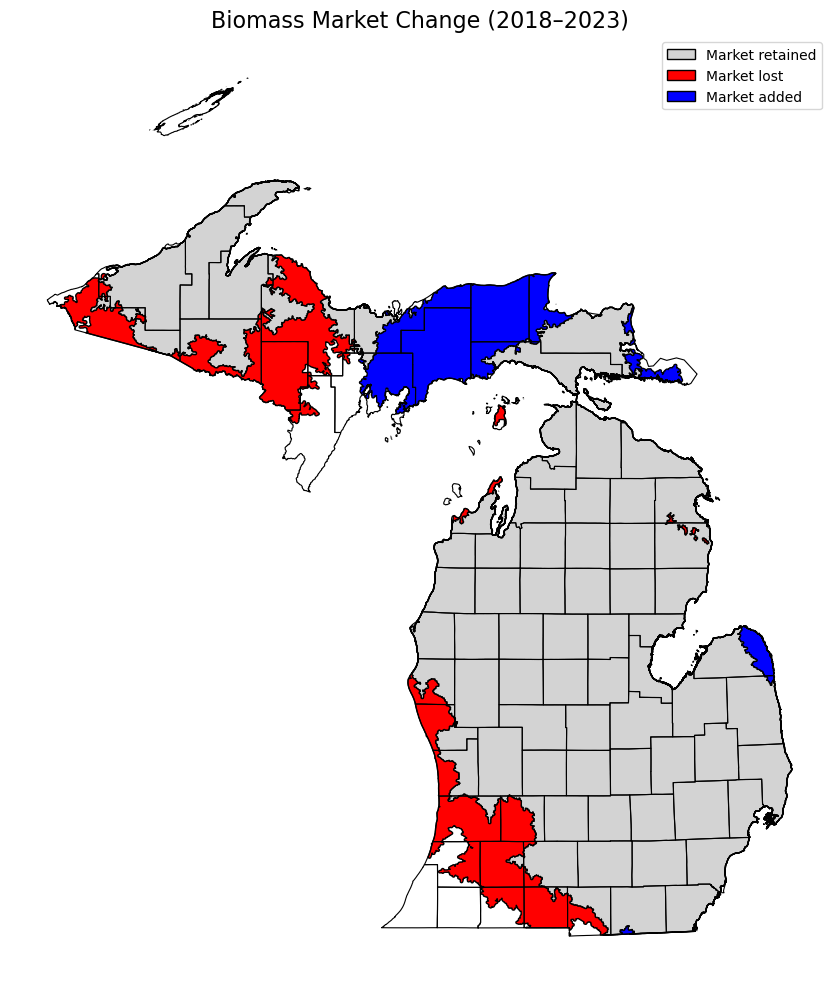

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
coverage_2018_fp = os.path.join(base_path, "biomass_coverage_2018.shp")
coverage_2023_fp = os.path.join(base_path, "biomass_coverage_2023.shp")
change_fp = os.path.join(base_path, "biomass_change_2018-2023.shp")
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load input data ---
gdf_2018 = gpd.read_file(coverage_2018_fp)
gdf_2023 = gpd.read_file(coverage_2023_fp)
gdf_mi = gpd.read_file(michigan_fp)

# --- Reproject if needed ---
if gdf_2018.crs != gdf_2023.crs:
    gdf_2023 = gdf_2023.to_crs(gdf_2018.crs)
if gdf_2018.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_2018.crs)

# --- Geometry union ---
geom_2018 = gdf_2018.unary_union
geom_2023 = gdf_2023.unary_union

# --- Calculate change types ---
retain = geom_2018.intersection(geom_2023)
loss = geom_2018.difference(geom_2023)
add = geom_2023.difference(geom_2018)

# --- Build and save GeoDataFrame ---
gdf_change = gpd.GeoDataFrame({
    "status": ["Market Retain", "Market Loss", "Market Add"],
    "geometry": [retain, loss, add]
}, crs=gdf_2018.crs)

gdf_change.to_file(change_fp)
print("✅ Shapefile saved to:", change_fp)

# --- Color mapping ---
color_map = {
    "Market Retain": "#D3D3D3",  # Light gray
    "Market Loss": "#FF0000",    # Red
    "Market Add": "#0000FF"      # Blue
}

# --- Plot ---
fig, ax = plt.subplots(figsize=(12, 10))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.8)

for status, color in color_map.items():
    gdf_change[gdf_change["status"] == status].plot(ax=ax, color=color, edgecolor='black')

# --- Legend ---
legend_elements = [
    Patch(facecolor=color_map["Market Retain"], edgecolor='black', label="Market retained"),
    Patch(facecolor=color_map["Market Loss"], edgecolor='black', label="Market lost"),
    Patch(facecolor=color_map["Market Add"], edgecolor='black', label="Market added")
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True)
ax.set_title("Biomass Market Change (2018–2023)", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()


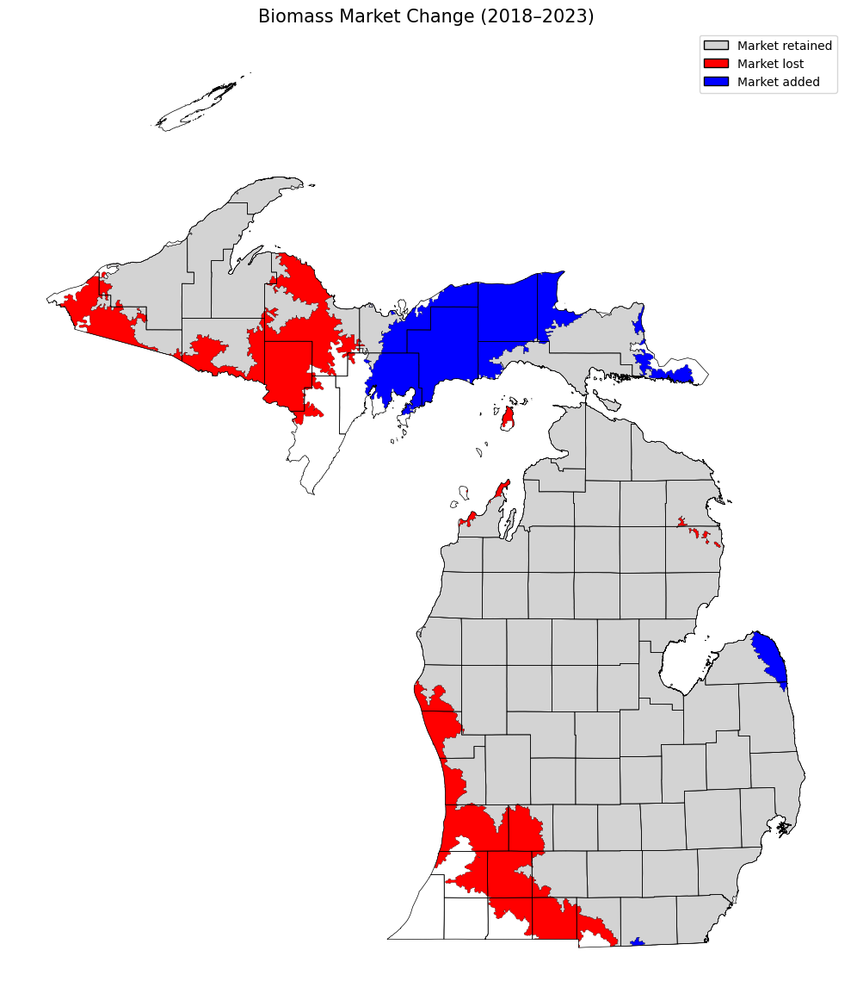

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths ---
base_dir   = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Market Coverage August 11\Data"
change_fp  = os.path.join(base_dir, "biomass_change_2018-2023.shp")
counties_fp = os.path.join(base_dir, "Counties_(v17a).shp")

# --- Load data ---
gdf_change = gpd.read_file(change_fp)
gdf_mi = gpd.read_file(counties_fp)

# --- Align CRS ---
if gdf_change.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_change.crs)

# --- Identify status column ---
candidate_cols = ["status", "Status", "STATUS", "market", "Market", "MARKET", "change", "Change", "category", "Category"]
status_col = next((c for c in candidate_cols if c in gdf_change.columns), None)
if status_col is None:
    raise ValueError(f"No status column found. Available: {list(gdf_change.columns)}")

# --- Normalize class names ---
val = gdf_change[status_col].astype(str).str.strip().str.lower()
map_dict = {
    "market retain": "Market Retain", "retain": "Market Retain", "retained": "Market Retain",
    "market loss": "Market Loss", "loss": "Market Loss", "lost": "Market Loss",
    "market add": "Market Add", "add": "Market Add", "added": "Market Add"
}
gdf_change["class"] = val.map(lambda x: map_dict.get(x, x.title()))

# --- Subsets ---
retain = gdf_change[gdf_change["class"] == "Market Retain"]
loss   = gdf_change[gdf_change["class"] == "Market Loss"]
add    = gdf_change[gdf_change["class"] == "Market Add"]

# --- Plot ---
fig, ax = plt.subplots(figsize=(10, 12))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.5)

if not retain.empty:
    retain.plot(ax=ax, color='lightgray', edgecolor='black', linewidth=0.2)
if not loss.empty:
    loss.plot(ax=ax, color='red', edgecolor='black', linewidth=0.2)
if not add.empty:
    add.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.2)

legend_elements = [
    Patch(facecolor='lightgray', edgecolor='black', label='Market retained'),
    Patch(facecolor='red', edgecolor='black', label='Market lost'),
    Patch(facecolor='blue', edgecolor='black', label='Market added')
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True, fontsize=10)
ax.set_title("Biomass Market Change (2018–2023)", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import geopandas as gpd
import os

# --- Path to your shapefile ---
base_dir = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Market Coverage August 11\Data"
shp_path = os.path.join(base_dir, "biomass_change_2018-2023.shp")  # change to your file

# --- Load shapefile ---
gdf = gpd.read_file(shp_path)

# --- Show all columns ---
print("📂 Columns in attribute table:")
for col in gdf.columns:
    print("-", col)

# --- Show unique values for each column ---
print("\n🔍 Unique values per column:")
for col in gdf.columns:
    unique_vals = gdf[col].unique()
    print(f"\n{col}:")
    print(unique_vals)


📂 Columns in attribute table:
- status
- geometry

🔍 Unique values per column:

status:
['Market Retain' 'Market Loss' 'Market Add']

geometry:
<GeometryArray>
[<MULTIPOLYGON (((-85.636 44.786, -85.636 44.786, -85.636 44.786, -85.636 44....>,
 <MULTIPOLYGON (((-86.287 42.402, -86.287 42.401, -86.288 42.401, -86.287 42....>,
 <MULTIPOLYGON (((-87.014 45.862, -87.013 45.863, -87.013 45.863, -87.013 45....>]
Length: 3, dtype: geometry


# Pulpwood

✅ Saved dissolved shapefile to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_coverage_1985.shp


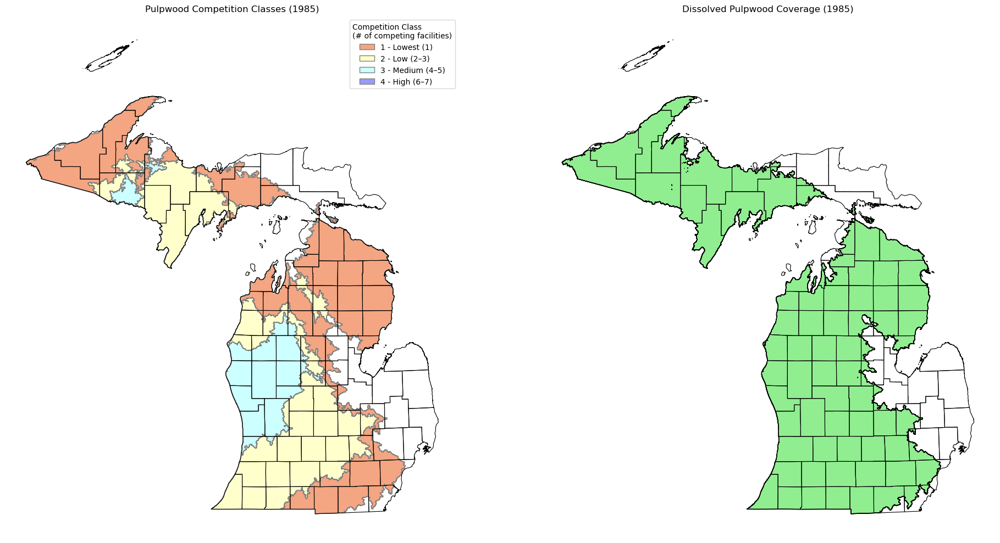

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")
pulpwood_1985_fp = os.path.join(base_path, "pulpwood_hotspots_1985.shp")
dissolved_pulpwood_fp = os.path.join(base_path, "pulpwood_coverage_1985.shp")

# --- Load data ---
gdf_mi = gpd.read_file(michigan_fp)
gdf_pulp = gpd.read_file(pulpwood_1985_fp)

# --- Reproject if needed ---
if gdf_pulp.crs != gdf_mi.crs:
    gdf_pulp = gdf_pulp.to_crs(gdf_mi.crs)

# --- Dissolve polygons and save ---
gdf_union = gdf_pulp.dissolve().reset_index(drop=True)
gdf_union["id"] = 1
gdf_union.to_file(dissolved_pulpwood_fp)
print("✅ Saved dissolved shapefile to:", dissolved_pulpwood_fp)

# --- Reload dissolved file to confirm ---
gdf_union = gpd.read_file(dissolved_pulpwood_fp)

# --- Color map for pulpwood competition classes ---
color_map = {
    "1 - Lowest (1985)": "#F4A582",
    "2 - Low (1985)": "#FFFFCC",
    "3 - Medium (1985)": "#CCFFFF",
    "4 - High (1985)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original classified polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_pulp[gdf_pulp["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# Legend
legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Pulpwood Competition Classes (1985)")
axes[0].axis("off")

# === Right: Dissolved polygon ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Pulpwood Coverage (1985)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


✅ Saved dissolved shapefile to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_coverage_1994.shp


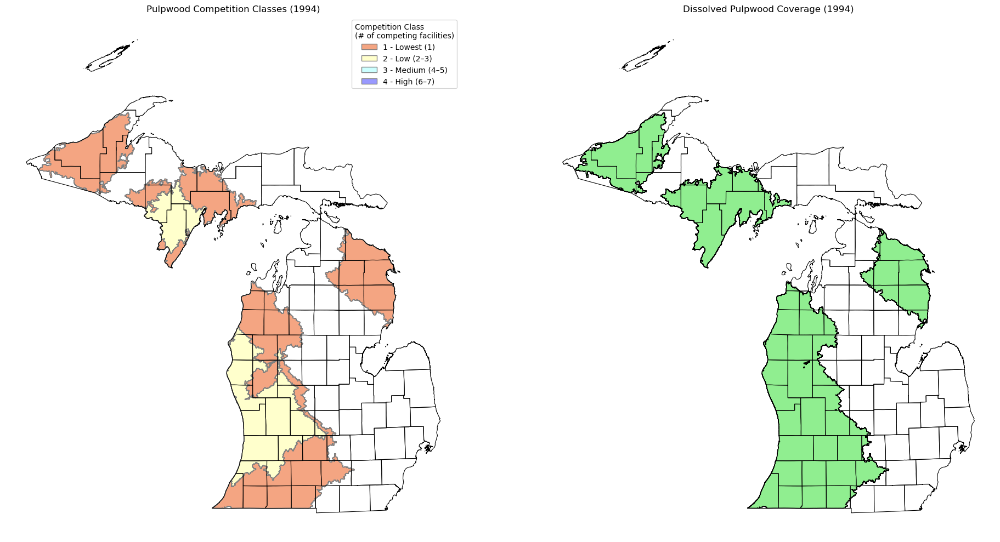

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")
pulpwood_1994_fp = os.path.join(base_path, "pulpwood_hotspots_1994.shp")
dissolved_pulpwood_fp = os.path.join(base_path, "pulpwood_coverage_1994.shp")

# --- Load data ---
gdf_mi = gpd.read_file(michigan_fp)
gdf_pulp = gpd.read_file(pulpwood_1994_fp)

# --- Reproject if needed ---
if gdf_pulp.crs != gdf_mi.crs:
    gdf_pulp = gdf_pulp.to_crs(gdf_mi.crs)

# --- Dissolve polygons and save ---
gdf_union = gdf_pulp.dissolve().reset_index(drop=True)
gdf_union["id"] = 1
gdf_union.to_file(dissolved_pulpwood_fp)
print("✅ Saved dissolved shapefile to:", dissolved_pulpwood_fp)

# --- Reload dissolved file to confirm ---
gdf_union = gpd.read_file(dissolved_pulpwood_fp)

# --- Color map for pulpwood competition classes ---
color_map = {
    "1 - Lowest (1994)": "#F4A582",
    "2 - Low (1994)": "#FFFFCC",
    "3 - Medium (1994)": "#CCFFFF",
    "4 - High (1994)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original classified polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_pulp[gdf_pulp["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# Legend
legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Pulpwood Competition Classes (1994)")
axes[0].axis("off")

# === Right: Dissolved polygon ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Pulpwood Coverage (1994)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


✅ Saved dissolved shapefile to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_coverage_2002.shp


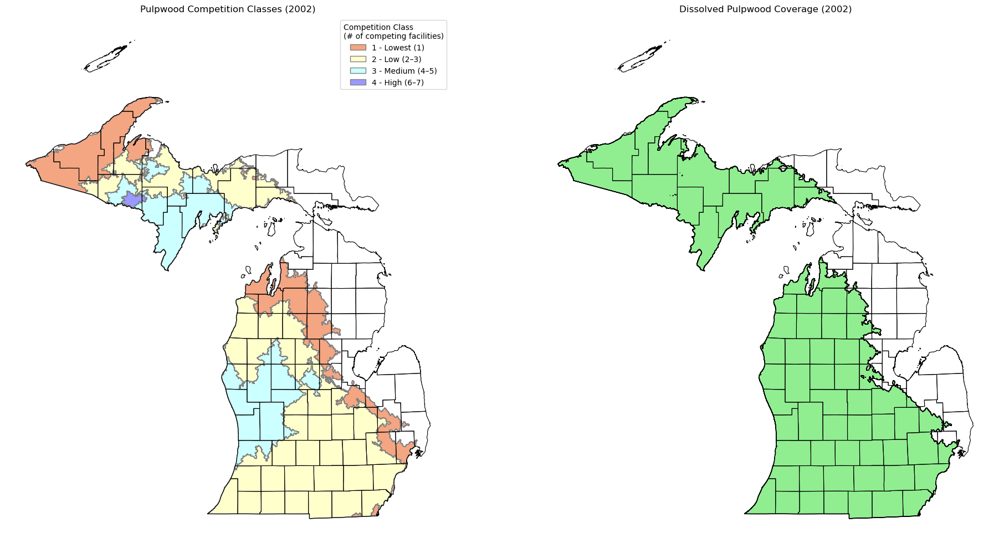

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")
pulpwood_2002_fp = os.path.join(base_path, "pulpwood_hotspots_2002.shp")
dissolved_pulpwood_fp = os.path.join(base_path, "pulpwood_coverage_2002.shp")

# --- Load data ---
gdf_mi = gpd.read_file(michigan_fp)
gdf_pulp = gpd.read_file(pulpwood_2002_fp)

# --- Reproject if needed ---
if gdf_pulp.crs != gdf_mi.crs:
    gdf_pulp = gdf_pulp.to_crs(gdf_mi.crs)

# --- Dissolve polygons and save ---
gdf_union = gdf_pulp.dissolve().reset_index(drop=True)
gdf_union["id"] = 1
gdf_union.to_file(dissolved_pulpwood_fp)
print("✅ Saved dissolved shapefile to:", dissolved_pulpwood_fp)

# --- Reload dissolved file to confirm ---
gdf_union = gpd.read_file(dissolved_pulpwood_fp)

# --- Color map for pulpwood competition classes ---
color_map = {
    "1 - Lowest (2002)": "#F4A582",
    "2 - Low (2002)": "#FFFFCC",
    "3 - Medium (2002)": "#CCFFFF",
    "4 - High (2002)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original classified polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_pulp[gdf_pulp["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# Legend
legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Pulpwood Competition Classes (2002)")
axes[0].axis("off")

# === Right: Dissolved polygon ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Pulpwood Coverage (2002)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


✅ Saved dissolved shapefile to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_coverage_2018.shp


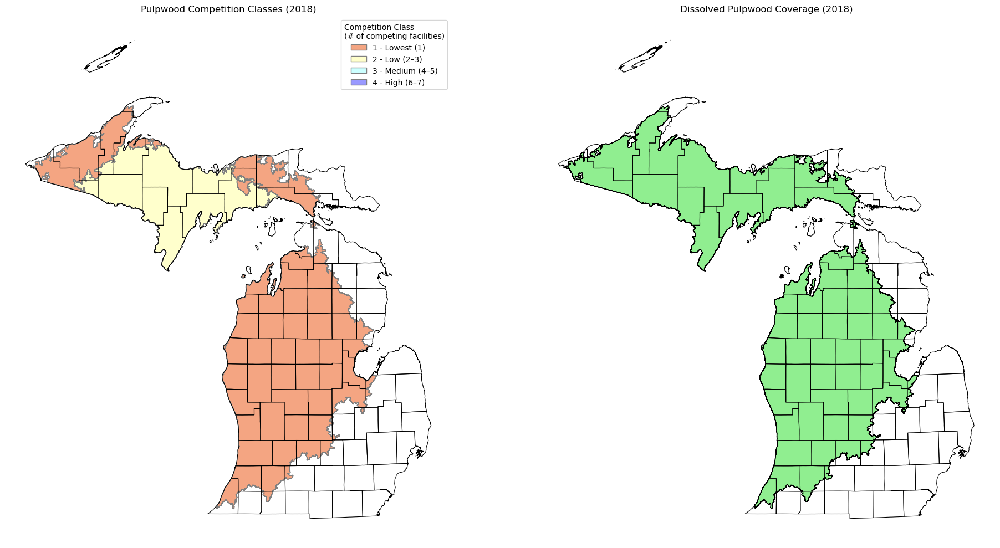

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")
pulpwood_2018_fp = os.path.join(base_path, "pulpwood_hotspots_2018.shp")
dissolved_pulpwood_fp = os.path.join(base_path, "pulpwood_coverage_2018.shp")

# --- Load data ---
gdf_mi = gpd.read_file(michigan_fp)
gdf_pulp = gpd.read_file(pulpwood_2018_fp)

# --- Reproject if needed ---
if gdf_pulp.crs != gdf_mi.crs:
    gdf_pulp = gdf_pulp.to_crs(gdf_mi.crs)

# --- Dissolve polygons and save ---
gdf_union = gdf_pulp.dissolve().reset_index(drop=True)
gdf_union["id"] = 1
gdf_union.to_file(dissolved_pulpwood_fp)
print("✅ Saved dissolved shapefile to:", dissolved_pulpwood_fp)

# --- Reload dissolved file to confirm ---
gdf_union = gpd.read_file(dissolved_pulpwood_fp)

# --- Color map for pulpwood competition classes ---
color_map = {
    "1 - Lowest (2018)": "#F4A582",
    "2 - Low (2018)": "#FFFFCC",
    "3 - Medium (2018)": "#CCFFFF",
    "4 - High (2018)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original classified polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_pulp[gdf_pulp["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# Legend
legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Pulpwood Competition Classes (2018)")
axes[0].axis("off")

# === Right: Dissolved polygon ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Pulpwood Coverage (2018)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


✅ Saved dissolved shapefile to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_coverage_2023.shp


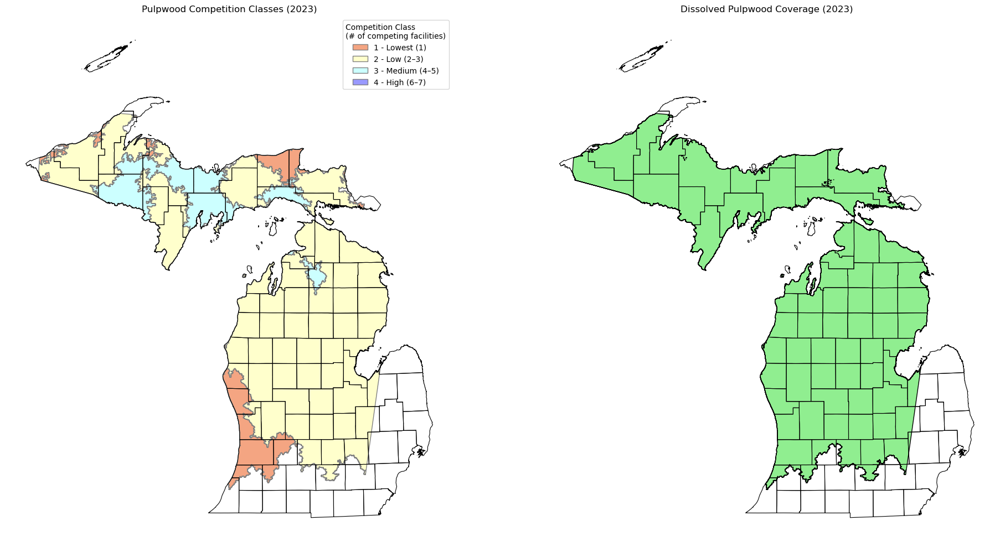

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- File paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")
pulpwood_2023_fp = os.path.join(base_path, "pulpwood_hotspots_2023.shp")
dissolved_pulpwood_fp = os.path.join(base_path, "pulpwood_coverage_2023.shp")

# --- Load data ---
gdf_mi = gpd.read_file(michigan_fp)
gdf_pulp = gpd.read_file(pulpwood_2023_fp)

# --- Reproject if needed ---
if gdf_pulp.crs != gdf_mi.crs:
    gdf_pulp = gdf_pulp.to_crs(gdf_mi.crs)

# --- Dissolve polygons and save ---
gdf_union = gdf_pulp.dissolve().reset_index(drop=True)
gdf_union["id"] = 1
gdf_union.to_file(dissolved_pulpwood_fp)
print("✅ Saved dissolved shapefile to:", dissolved_pulpwood_fp)

# --- Reload dissolved file to confirm ---
gdf_union = gpd.read_file(dissolved_pulpwood_fp)

# --- Color map for pulpwood competition classes ---
color_map = {
    "1 - Lowest (2023)": "#F4A582",
    "2 - Low (2023)": "#FFFFCC",
    "3 - Medium (2023)": "#CCFFFF",
    "4 - High (2023)": "#9999FF"
}

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# === Left: Original classified polygons ===
gdf_mi.boundary.plot(ax=axes[0], color='black', linewidth=0.8)
for label, color in color_map.items():
    subset = gdf_pulp[gdf_pulp["label"] == label]
    if not subset.empty:
        subset.plot(ax=axes[0], color=color, edgecolor='grey')

# Legend
legend_elements = [
    Patch(facecolor="#F4A582", edgecolor='grey', label="1 - Lowest (1)"),
    Patch(facecolor="#FFFFCC", edgecolor='grey', label="2 - Low (2–3)"),
    Patch(facecolor="#CCFFFF", edgecolor='grey', label="3 - Medium (4–5)"),
    Patch(facecolor="#9999FF", edgecolor='grey', label="4 - High (6–7)")
]
axes[0].legend(handles=legend_elements,
               title="Competition Class\n(# of competing facilities)",
               loc='upper right', frameon=True)
axes[0].set_title("Pulpwood Competition Classes (2023)")
axes[0].axis("off")

# === Right: Dissolved polygon ===
gdf_mi.boundary.plot(ax=axes[1], color='black', linewidth=0.8)
gdf_union.plot(ax=axes[1], color='lightgreen', edgecolor='black')
axes[1].set_title("Dissolved Pulpwood Coverage (2023)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\2845533535.py:25: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_1985 = gdf_1985.unary_union
C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\2845533535.py:26: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_2023 = gdf_2023.unary_union


✅ Shapefile saved to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_change_1985-2023.shp


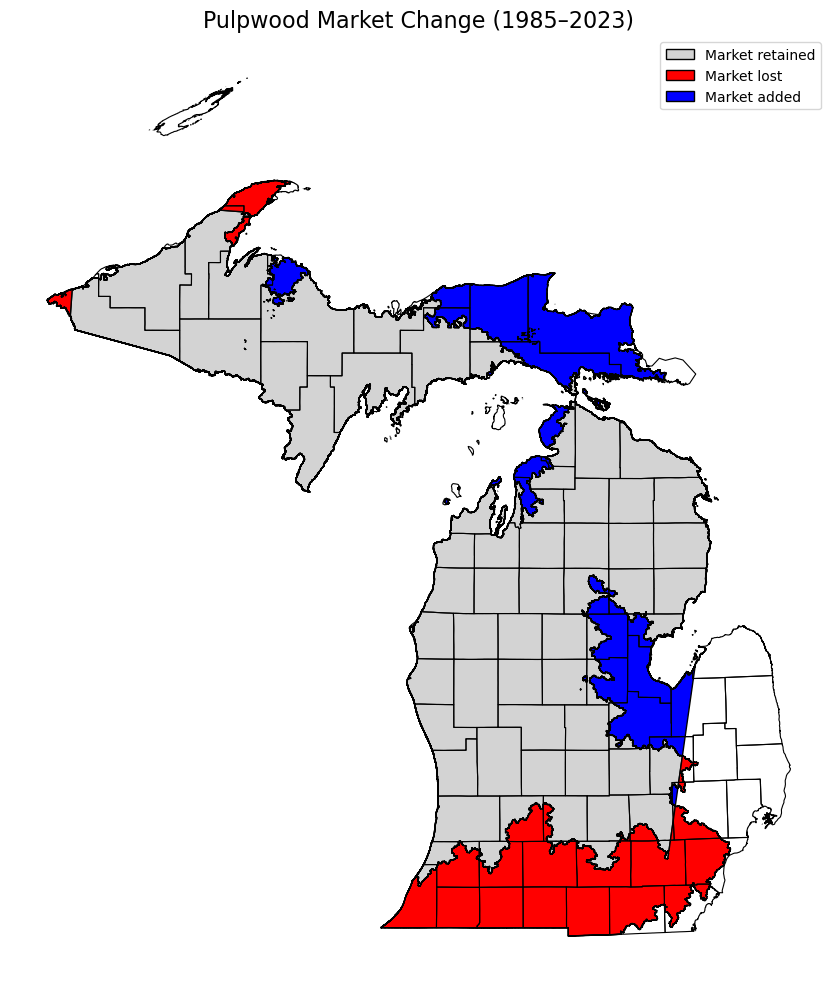

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
coverage_1985_fp = os.path.join(base_path, "pulpwood_coverage_1985.shp")
coverage_2023_fp = os.path.join(base_path, "pulpwood_coverage_2023.shp")
change_fp = os.path.join(base_path, "pulpwood_change_1985-2023.shp")
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load input data ---
gdf_1985 = gpd.read_file(coverage_1985_fp)
gdf_2023 = gpd.read_file(coverage_2023_fp)
gdf_mi = gpd.read_file(michigan_fp)

# --- Reproject if needed ---
if gdf_1985.crs != gdf_2023.crs:
    gdf_2023 = gdf_2023.to_crs(gdf_1985.crs)
if gdf_1985.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_1985.crs)

# --- Geometry union ---
geom_1985 = gdf_1985.unary_union
geom_2023 = gdf_2023.unary_union

# --- Calculate change types ---
retain = geom_1985.intersection(geom_2023)
loss = geom_1985.difference(geom_2023)
add = geom_2023.difference(geom_1985)

# --- Build and save GeoDataFrame ---
gdf_change = gpd.GeoDataFrame({
    "status": ["Market Retain", "Market Loss", "Market Add"],
    "geometry": [retain, loss, add]
}, crs=gdf_1985.crs)

gdf_change.to_file(change_fp)
print("✅ Shapefile saved to:", change_fp)

# --- Color mapping ---
color_map = {
    "Market Retain": "#D3D3D3",  # Light gray
    "Market Loss": "#FF0000",    # Red
    "Market Add": "#0000FF"      # Blue
}

# --- Plot ---
fig, ax = plt.subplots(figsize=(12, 10))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.8)

for status, color in color_map.items():
    gdf_change[gdf_change["status"] == status].plot(ax=ax, color=color, edgecolor='black')

# --- Legend ---
legend_elements = [
    Patch(facecolor=color_map["Market Retain"], edgecolor='black', label="Market retained"),
    Patch(facecolor=color_map["Market Loss"], edgecolor='black', label="Market lost"),
    Patch(facecolor=color_map["Market Add"], edgecolor='black', label="Market added")
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True)
ax.set_title("Pulpwood Market Change (1985–2023)", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()


C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\1939457959.py:41: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_1994 = gdf_1994.unary_union
C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\1939457959.py:42: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_2023 = gdf_2023.unary_union


✅ Shapefile saved to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_change_1994-2023.shp


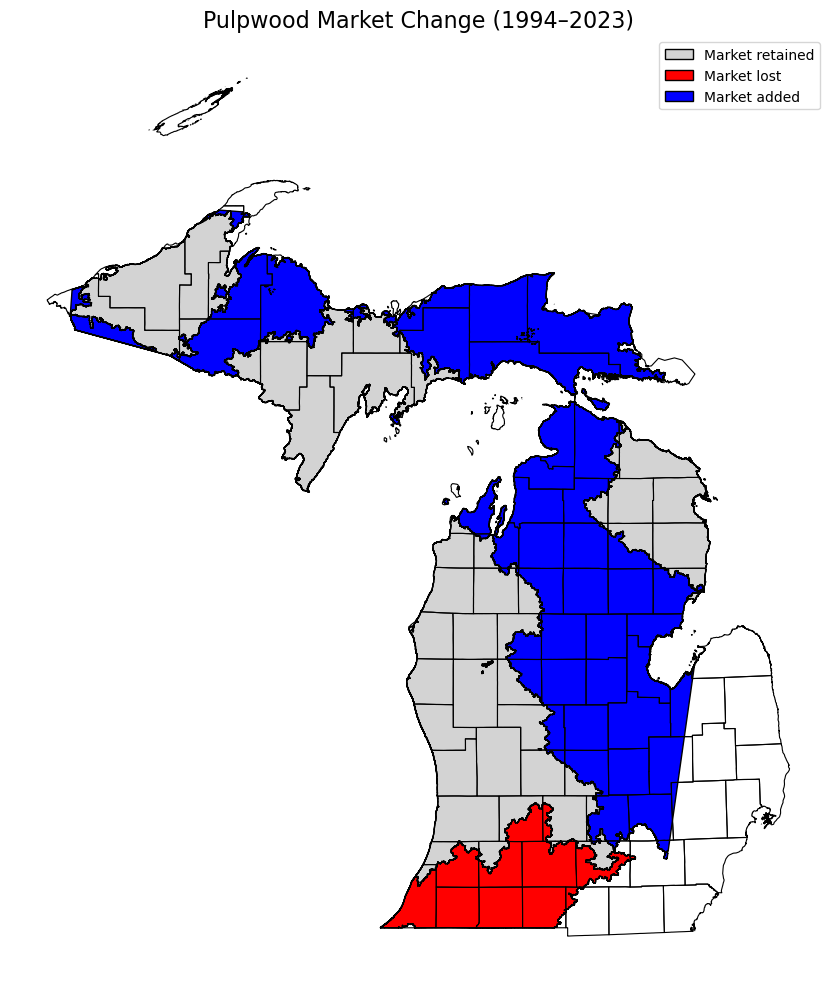

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os
from shapely.geometry import GeometryCollection, MultiPolygon, Polygon

# --- Helper function to sanitize geometry ---
def flatten_geometry(geom):
    if geom.is_empty:
        return None
    elif isinstance(geom, (Polygon, MultiPolygon)):
        return geom
    elif isinstance(geom, GeometryCollection):
        # Extract only Polygon or MultiPolygon parts
        polys = [g for g in geom.geoms if isinstance(g, (Polygon, MultiPolygon))]
        if not polys:
            return None
        return MultiPolygon(polys) if len(polys) > 1 else polys[0]
    else:
        return None

# --- Paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
coverage_1994_fp = os.path.join(base_path, "pulpwood_coverage_1994.shp")
coverage_2023_fp = os.path.join(base_path, "pulpwood_coverage_2023.shp")
change_fp = os.path.join(base_path, "pulpwood_change_1994-2023.shp")
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load input data ---
gdf_1994 = gpd.read_file(coverage_1994_fp)
gdf_2023 = gpd.read_file(coverage_2023_fp)
gdf_mi = gpd.read_file(michigan_fp)

# --- Reproject if needed ---
if gdf_1994.crs != gdf_2023.crs:
    gdf_2023 = gdf_2023.to_crs(gdf_1994.crs)
if gdf_1994.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_1994.crs)

# --- Union geometries ---
geom_1994 = gdf_1994.unary_union
geom_2023 = gdf_2023.unary_union

# --- Compute change geometries and flatten ---
retain = flatten_geometry(geom_1994.intersection(geom_2023))
loss = flatten_geometry(geom_1994.difference(geom_2023))
add = flatten_geometry(geom_2023.difference(geom_1994))

# --- Build cleaned GeoDataFrame ---
status_list = []
geometry_list = []

if retain: status_list.append("Market Retain"); geometry_list.append(retain)
if loss:   status_list.append("Market Loss");   geometry_list.append(loss)
if add:    status_list.append("Market Add");    geometry_list.append(add)

gdf_change = gpd.GeoDataFrame({
    "status": status_list,
    "geometry": geometry_list
}, crs=gdf_1994.crs)

# --- Save shapefile safely ---
gdf_change.to_file(change_fp)
print("✅ Shapefile saved to:", change_fp)

# --- Color mapping ---
color_map = {
    "Market Retain": "#D3D3D3",
    "Market Loss": "#FF0000",
    "Market Add": "#0000FF"
}

# --- Plot ---
fig, ax = plt.subplots(figsize=(12, 10))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.8)

for status, color in color_map.items():
    subset = gdf_change[gdf_change["status"] == status]
    if not subset.empty:
        subset.plot(ax=ax, color=color, edgecolor='black')

# --- Legend ---
legend_elements = [
    Patch(facecolor=color_map["Market Retain"], edgecolor='black', label="Market retained"),
    Patch(facecolor=color_map["Market Loss"], edgecolor='black', label="Market lost"),
    Patch(facecolor=color_map["Market Add"], edgecolor='black', label="Market added")
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True)
ax.set_title("Pulpwood Market Change (1994–2023)", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()


C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\1690538451.py:25: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_2002 = gdf_2002.unary_union
C:\Users\khanalna\AppData\Local\Temp\ipykernel_21104\1690538451.py:26: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_2023 = gdf_2023.unary_union


✅ Shapefile saved to: C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data\pulpwood_change_2002-2023.shp


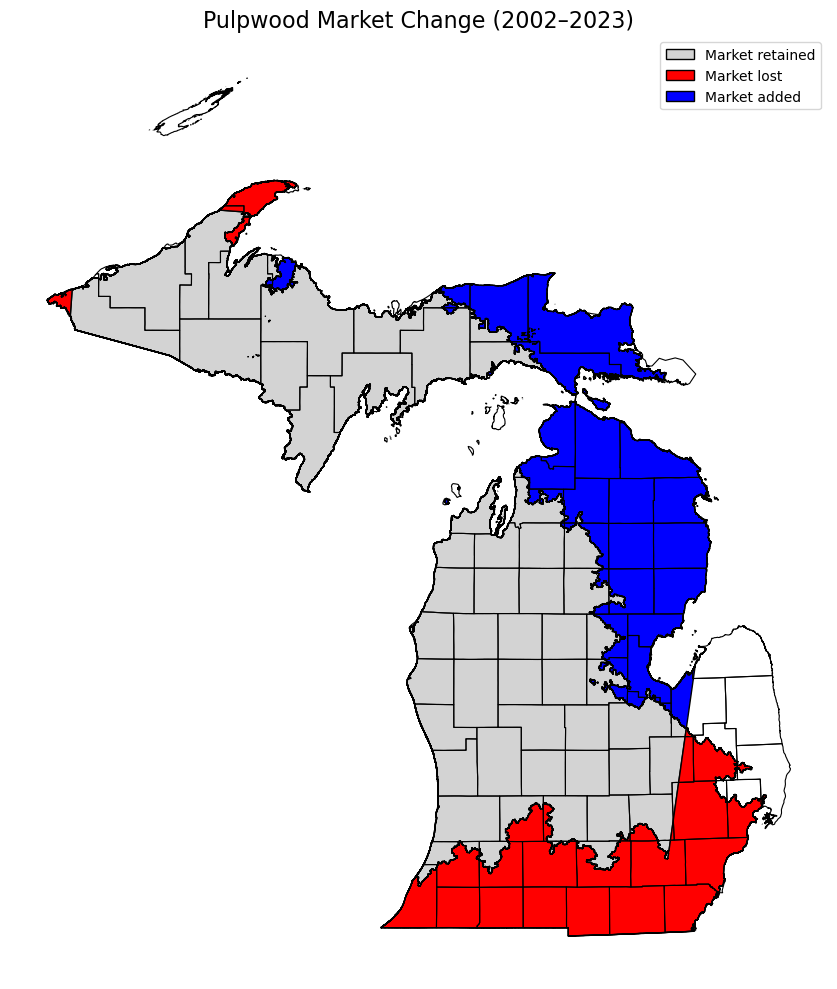

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import os

# --- Paths ---
base_path = r"C:\Users\khanalna\OneDrive - Oregon State University\Naresh Personal\MSU Manuscript\June 25\Hotspots disolved July 27\Data"
coverage_2002_fp = os.path.join(base_path, "pulpwood_coverage_2002.shp")
coverage_2023_fp = os.path.join(base_path, "pulpwood_coverage_2023.shp")
change_fp = os.path.join(base_path, "pulpwood_change_2002-2023.shp")
michigan_fp = os.path.join(base_path, "Counties_(v17a).shp")

# --- Load input data ---
gdf_2002 = gpd.read_file(coverage_2002_fp)
gdf_2023 = gpd.read_file(coverage_2023_fp)
gdf_mi = gpd.read_file(michigan_fp)

# --- Reproject if needed ---
if gdf_2002.crs != gdf_2023.crs:
    gdf_2023 = gdf_2023.to_crs(gdf_2002.crs)
if gdf_2002.crs != gdf_mi.crs:
    gdf_mi = gdf_mi.to_crs(gdf_2002.crs)

# --- Geometry union ---
geom_2002 = gdf_2002.unary_union
geom_2023 = gdf_2023.unary_union

# --- Calculate change types ---
retain = geom_2002.intersection(geom_2023)
loss = geom_2002.difference(geom_2023)
add = geom_2023.difference(geom_2002)

# --- Build and save GeoDataFrame ---
gdf_change = gpd.GeoDataFrame({
    "status": ["Market Retain", "Market Loss", "Market Add"],
    "geometry": [retain, loss, add]
}, crs=gdf_2002.crs)

gdf_change.to_file(change_fp)
print("✅ Shapefile saved to:", change_fp)

# --- Color mapping ---
color_map = {
    "Market Retain": "#D3D3D3",  # Light gray
    "Market Loss": "#FF0000",    # Red
    "Market Add": "#0000FF"      # Blue
}

# --- Plot ---
fig, ax = plt.subplots(figsize=(12, 10))
gdf_mi.boundary.plot(ax=ax, color='black', linewidth=0.8)

for status, color in color_map.items():
    gdf_change[gdf_change["status"] == status].plot(ax=ax, color=color, edgecolor='black')

# --- Legend ---
legend_elements = [
    Patch(facecolor=color_map["Market Retain"], edgecolor='black', label="Market retained"),
    Patch(facecolor=color_map["Market Loss"], edgecolor='black', label="Market lost"),
    Patch(facecolor=color_map["Market Add"], edgecolor='black', label="Market added")
]
ax.legend(handles=legend_elements, loc='upper right', frameon=True)
ax.set_title("Pulpwood Market Change (2002–2023)", fontsize=16)
ax.axis("off")
plt.tight_layout()
plt.show()
